In [1]:

import os
import random
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import math
import torch
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, datasets, transforms
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score
     

In [2]:
import torch

if torch.cuda.is_available():
    device = "cuda"
elif torch.backends.mps.is_available():
    device = "mps"
else:
    device = "cpu"

print("Using:", device)

Using: mps


In [3]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

transform = transforms.Compose([
    transforms.Resize((180, 180)),
    transforms.ToTensor(),
])

train_dataset = datasets.ImageFolder(
    root="tf_flowers_images",
    transform=transform
)

train_loader = DataLoader(
    train_dataset,
    batch_size=32,
    shuffle=True
)


In [4]:
classes = train_dataset.classes
print("Anzahl Bilder:", len(train_dataset))
print("Klassennamen:", classes)
print("Mapping Klassen → Label:", train_dataset.class_to_idx)


Anzahl Bilder: 3670
Klassennamen: ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']
Mapping Klassen → Label: {'daisy': 0, 'dandelion': 1, 'roses': 2, 'sunflowers': 3, 'tulips': 4}


In [5]:
from torch.utils.data import random_split
images, labels = next(iter(train_loader))
print(images.shape)   # (batch_size, 3, 180, 180)
print(labels.shape)   # (batch_size,)

train_size = int(0.9 * len(train_dataset))
test_size = len(train_dataset) - train_size

train_df, test_ds = random_split(train_dataset, [train_size, test_size])
train_size = int(0.9 * len(train_df))
val_size = len(train_df) - train_size
train_ds, val_ds = random_split(train_df, [train_size, val_size])


train_loaderS = DataLoader(train_ds, batch_size=32, shuffle=True)
val_loaderS = DataLoader(val_ds, batch_size=32)
test_loaderS = DataLoader(test_ds, batch_size=32, shuffle=False)

torch.Size([32, 3, 180, 180])
torch.Size([32])


In [6]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class SimpleNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(3*180*180, 128)
        self.fc2 = nn.Linear(128, 5)    # 5 flower classes

    def forward(self, x):
        x = x.view(x.size(0), -1)   # flatten
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

modelS = SimpleNet()

In [7]:
# 1. Ensure the model is on the correct device BEFORE the loop
modelS = modelS.to(device)

criterionS = nn.CrossEntropyLoss()
optimizerS = torch.optim.Adam(modelS.parameters(), lr=0.001)

history = {
    'train_loss': [], 'val_loss': [],
    'train_acc': [], 'val_acc': []
}

for epoch in range(10):  # number of epochs
    # --- TRAINING ---
    modelS.train() # Set to train mode

    running_loss = 0.0
    correct_train = 0
    total_train = 0
    
    for images, labels in train_loader:
        # CRITICAL FIX 1: Move data to device immediately
        images = images.to(device)
        labels = labels.to(device)

        # 1. Zero gradients
        optimizerS.zero_grad()
        
        # 2. Forward pass (Input is already on device, so output will be too)
        outputs = modelS(images)
        
        # 3. Compute loss (Both outputs and labels are now on device)
        loss = criterionS(outputs, labels)
        
        # 4. Backward pass
        loss.backward()
        
        # 5. Update weights
        optimizerS.step()
        
        # Update statistics
        running_loss += loss.item()
        
        # Calculate Train Accuracy
        _, predicted = torch.max(outputs, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()

    # CRITICAL FIX 2: Use running_loss, not train_loss
    avg_train_loss = running_loss / len(train_loader)
    train_acc = correct_train / total_train
        
    # --- VALIDATION ---
    modelS.eval() # Set to eval mode
    val_loss = 0.0
    correct_val = 0
    total_val = 0
        
    with torch.no_grad():
        # Note: Ensure you use 'val_loader' or 'val_loaderS' (check your variable name)
        for images, labels in val_loaderS: 
            images = images.to(device)
            labels = labels.to(device)
            
            outputs = modelS(images)
            loss = criterionS(outputs, labels)
                
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total_val += labels.size(0)
            correct_val += (predicted == labels).sum().item()
                
    avg_val_loss = val_loss / len(val_loaderS)
    val_acc = correct_val / total_val
        
    # Store history
    history['train_loss'].append(avg_train_loss)
    history['val_loss'].append(avg_val_loss)
    history['train_acc'].append(train_acc)
    history['val_acc'].append(val_acc)
        
    print(f"Epoch {epoch+1}: Train Loss {avg_train_loss:.4f} | Val Loss {avg_val_loss:.4f} | Val Acc {val_acc:.4f}")

Epoch 1: Train Loss 4.1170 | Val Loss 1.2669 | Val Acc 0.4924
Epoch 2: Train Loss 1.4229 | Val Loss 1.4137 | Val Acc 0.4199
Epoch 3: Train Loss 1.3554 | Val Loss 1.5321 | Val Acc 0.4199
Epoch 4: Train Loss 1.2839 | Val Loss 1.1794 | Val Acc 0.4985
Epoch 5: Train Loss 1.1641 | Val Loss 1.2765 | Val Acc 0.4502
Epoch 6: Train Loss 1.1318 | Val Loss 1.0263 | Val Acc 0.6163
Epoch 7: Train Loss 1.1355 | Val Loss 1.0453 | Val Acc 0.5861
Epoch 8: Train Loss 1.1075 | Val Loss 1.0673 | Val Acc 0.5740
Epoch 9: Train Loss 1.1132 | Val Loss 1.0397 | Val Acc 0.5861
Epoch 10: Train Loss 1.1065 | Val Loss 1.0046 | Val Acc 0.6012


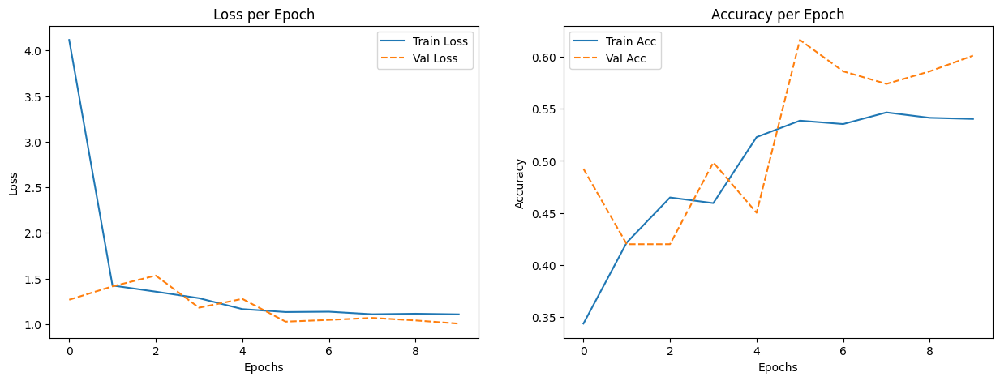

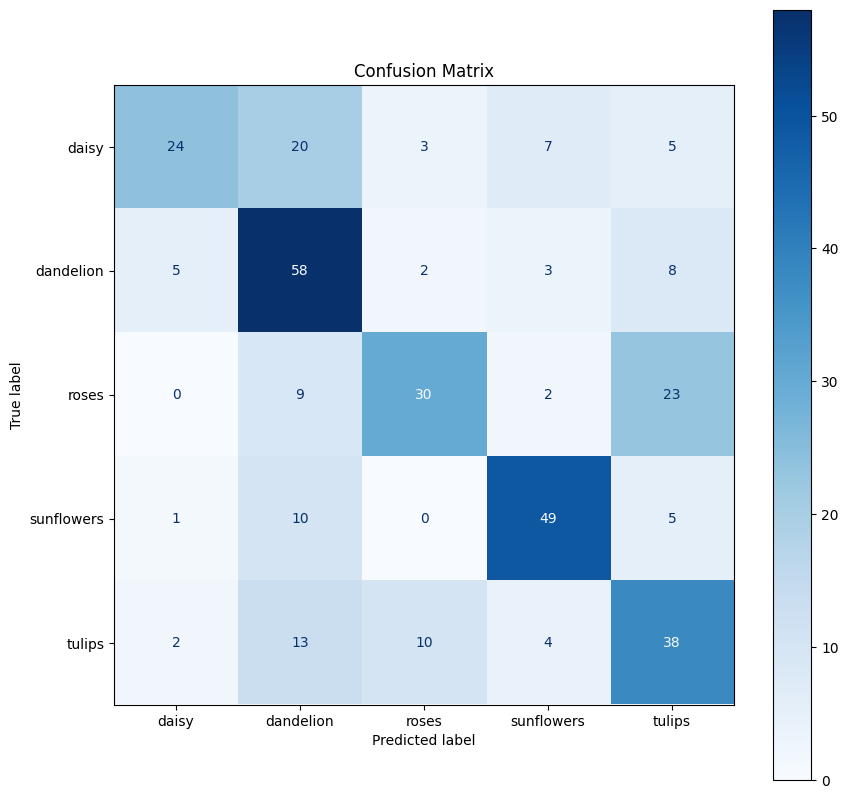

In [8]:
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
# 1. Plot Loss and Accuracy
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

# Loss Plot
ax[0].plot(history['train_loss'], label='Train Loss')
ax[0].plot(history['val_loss'], label='Val Loss', linestyle='--')
ax[0].set_title('Loss per Epoch')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].legend()

# Accuracy Plot
ax[1].plot(history['train_acc'], label='Train Acc')
ax[1].plot(history['val_acc'], label='Val Acc', linestyle='--')
ax[1].set_title('Accuracy per Epoch')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Accuracy')
ax[1].legend()

plt.show()

# 2. Confusion Matrix (on Validation or Test Set)
# We use the best model state here ideally
modelS.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in val_loaderS: # Or test_loader
        images, labels = images.to(device), labels.to(device)
        outputs = modelS(images)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
fig, ax = plt.subplots(figsize=(10, 10))
disp.plot(cmap='Blues', ax=ax)
plt.title('Confusion Matrix')
plt.show()

In [9]:
from sklearn.metrics import (
    roc_curve, auc,
    precision_recall_curve, f1_score
)
# Evaluate the model using PyTorch
modelS.to(device)
modelS.eval()

y_true = []
y_pred = []

for images, labels in val_loaderS:
    images = images.to(device)
    outputs = modelS(images)
    _, predicted = torch.max(outputs, 1)
    y_pred.extend(predicted.cpu().numpy())
    y_true.extend(labels.cpu().numpy())

f1 = f1_score(y_true, y_pred, average='macro')

print(f'Macro F1 Score: {f1}')

Macro F1 Score: 0.5951962512197971


10 epochs: Macro F1 Score: 0.3965480814869717
50 epochs: Macro F1 Score: 0.40983782361064913

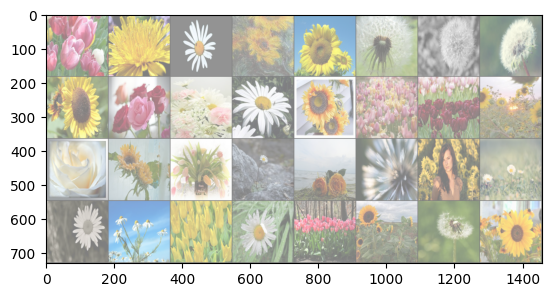

tulips dandelion daisy sunflowers sunflowers dandelion dandelion dandelion sunflowers roses daisy daisy sunflowers tulips tulips sunflowers roses sunflowers tulips daisy roses dandelion sunflowers daisy daisy daisy tulips daisy tulips sunflowers dandelion sunflowers


In [11]:
# functions to show an image
import torchvision

def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()


# get some random training images
dataiter = iter(train_loader)
images, labels = next(dataiter)

# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print(' '.join(f'{classes[labels[j]]:5s}' for j in range(32)))

In [12]:
import torch.nn as nn
import torch.nn.functional as F


class Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 6, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.fc1 = nn.Linear(28224, 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 10)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))

        x = torch.flatten(x, 1) 
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x


net2 = Net().to(device)

In [13]:
import torch.optim as optim
# Classification Cross-Entropy loss and SGD with momentum.


criterion2 = nn.CrossEntropyLoss()
optimizer2 = optim.SGD(net2.parameters(), lr=0.001, momentum=0.9)

In [14]:
history = {
    'train_loss': [], 'val_loss': [],
    'train_acc': [], 'val_acc': []
}
for epoch in range(50):  # loop over the dataset multiple times

    train_loss = 0.0
    correct_train = 0
    total_train = 0
    for inputs, labels in train_loader:
        # get the inputs; data is a list of [inputs, labels]
        inputs = inputs.to(device)
        labels = labels.to(device)
        # zero the parameter gradients
        optimizer2.zero_grad()

        # forward + backward + optimize
        outputs = net2(inputs)
        loss = criterion2(outputs, labels)
        loss.backward()
        optimizer2.step()

        # print statistics
        train_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    avg_train_loss = train_loss / len(train_loader)
    train_acc = correct_train / total_train
    
    # --- VALIDATION ---
    net2.eval()
    val_loss = 0.0
    correct_val = 0
    total_val = 0
    
    with torch.no_grad():
        for images, labels in val_loaderS:
            images, labels = images.to(device), labels.to(device)
            outputs = net2(images)
            loss = criterionS(outputs, labels)
            
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total_val += labels.size(0)
            correct_val += (predicted == labels).sum().item()
            
    avg_val_loss = val_loss / len(val_loaderS)
    val_acc = correct_val / total_val
    
    # Store history
    history['train_loss'].append(avg_train_loss)
    history['val_loss'].append(avg_val_loss)
    history['train_acc'].append(train_acc)
    history['val_acc'].append(val_acc)
    
    print(f"Epoch {epoch+1}: Train Loss {avg_train_loss:.4f} | Val Loss {avg_val_loss:.4f} | Val Acc {val_acc:.4f}")

print('Finished Training')

Epoch 1: Train Loss 1.9179 | Val Loss 1.5864 | Val Acc 0.2689
Epoch 2: Train Loss 1.5470 | Val Loss 1.4802 | Val Acc 0.3474
Epoch 3: Train Loss 1.4709 | Val Loss 1.4067 | Val Acc 0.3565
Epoch 4: Train Loss 1.4341 | Val Loss 1.3871 | Val Acc 0.4048
Epoch 5: Train Loss 1.4097 | Val Loss 1.4127 | Val Acc 0.3897
Epoch 6: Train Loss 1.3704 | Val Loss 1.3323 | Val Acc 0.4109
Epoch 7: Train Loss 1.3237 | Val Loss 1.2687 | Val Acc 0.4471
Epoch 8: Train Loss 1.2439 | Val Loss 1.1449 | Val Acc 0.5196
Epoch 9: Train Loss 1.1704 | Val Loss 1.1620 | Val Acc 0.4743
Epoch 10: Train Loss 1.1270 | Val Loss 1.0931 | Val Acc 0.4985
Epoch 11: Train Loss 1.1026 | Val Loss 1.0675 | Val Acc 0.5468
Epoch 12: Train Loss 1.0580 | Val Loss 1.0671 | Val Acc 0.5347
Epoch 13: Train Loss 1.0241 | Val Loss 0.9961 | Val Acc 0.6193
Epoch 14: Train Loss 0.9878 | Val Loss 0.9566 | Val Acc 0.6254
Epoch 15: Train Loss 0.9566 | Val Loss 0.8737 | Val Acc 0.6767
Epoch 16: Train Loss 0.9370 | Val Loss 0.8588 | Val Acc 0.6647
E

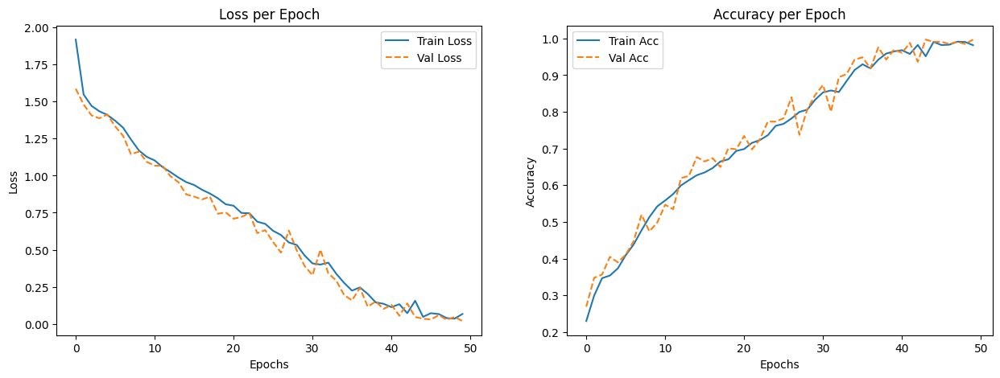

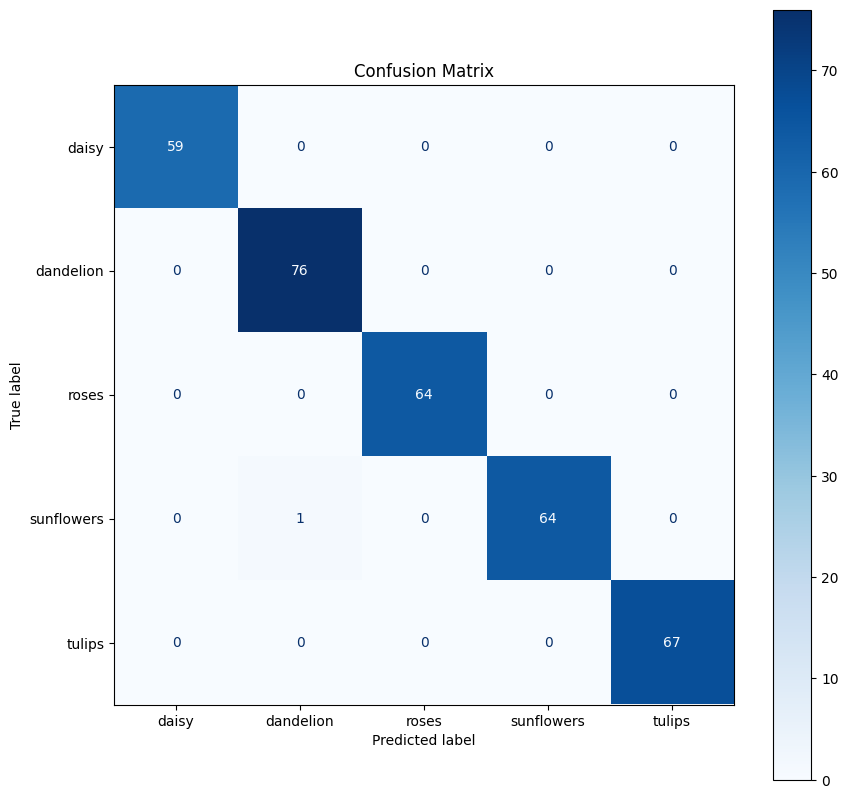

In [15]:
# 1. Plot Loss and Accuracy
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

# Loss Plot
ax[0].plot(history['train_loss'], label='Train Loss')
ax[0].plot(history['val_loss'], label='Val Loss', linestyle='--')
ax[0].set_title('Loss per Epoch')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].legend()

# Accuracy Plot
ax[1].plot(history['train_acc'], label='Train Acc')
ax[1].plot(history['val_acc'], label='Val Acc', linestyle='--')
ax[1].set_title('Accuracy per Epoch')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Accuracy')
ax[1].legend()

plt.show()

# 2. Confusion Matrix (on Validation or Test Set)
# We use the best model state here ideally
net2.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in val_loaderS: # Or test_loader
        images, labels = images.to(device), labels.to(device)
        outputs = net2(images)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
fig, ax = plt.subplots(figsize=(10, 10))
disp.plot(cmap='Blues', ax=ax)
plt.title('Confusion Matrix')
plt.show()

In [16]:
outputs = net2(images)

In [17]:
from sklearn.metrics import (
    roc_curve, auc,
    precision_recall_curve, f1_score
)

net2.to(device)
net2.eval()  # CRITICAL: This disables Dropout and Batch Norm updates

y_true = []
y_pred = []

# 3. Iterate through the TEST loader (not Val)
print("Evaluating on Test Set...")
with torch.no_grad():  # Save memory, don't calculate gradients
    for images, labels in test_loaderS:  # Use test_loader here!
        images = images.to(device)
        labels = labels.to(device)
        
        # Forward pass
        outputs = modelS(images)
        
        # Get predictions
        _, predicted = torch.max(outputs, 1)
        
        # Move to CPU and convert to numpy for sklearn
        y_pred.extend(predicted.cpu().numpy())
        y_true.extend(labels.cpu().numpy())

# 4. Calculate Macro F1
macro_f1 = f1_score(y_true, y_pred, average='macro')
print(f'Final Test Set Macro F1 Score: {macro_f1:.4f}')


Evaluating on Test Set...
Final Test Set Macro F1 Score: 0.6063



10 epochs : (3min)
    Precision: 0.6205357142857143
    Recall: 0.9586206896551724
    F1 Score: 0.7533875338753387
    Macro F1 Score: 0.3904868199912113
30 epochs : (9min)
    Precision: 0.7942857142857143
    Recall: 0.8176470588235294
    F1 Score: 0.8057971014492753
50 epochs : (14 min)
Final Test Set Macro F1 Score: 0.6063

60 epochs: (18min)
    Macro F1 Score: 0.5762166245424126

    

In [18]:
image_path_list = []
label_list = []

for class_cat in os.listdir("tf_flowers_images"):
    if class_cat.startswith("."):   # ignore system files
        continue
    for image_object in os.listdir(f"tf_flowers_images/{class_cat}"):
        if image_object.startswith("."):
            continue
        image_path_list.append(f"tf_flowers_images/{class_cat}/{image_object}")
        label_list.append(class_cat)
df = pd.DataFrame()

df["image_path"] = image_path_list
df["label"] = label_list

df

,image_path,label
0,tf_flowers_images/roses/1353.jpg,roses
1,tf_flowers_images/roses/1347.jpg,roses
2,tf_flowers_images/roses/2869.jpg,roses
3,tf_flowers_images/roses/162.jpg,roses
4,tf_flowers_images/roses/2470.jpg,roses
...,...,...
3665,tf_flowers_images/tulips/3549.jpg,tulips
3666,tf_flowers_images/tulips/1438.jpg,tulips
3667,tf_flowers_images/tulips/0.jpg,tulips
3668,tf_flowers_images/tulips/2131.jpg,tulips


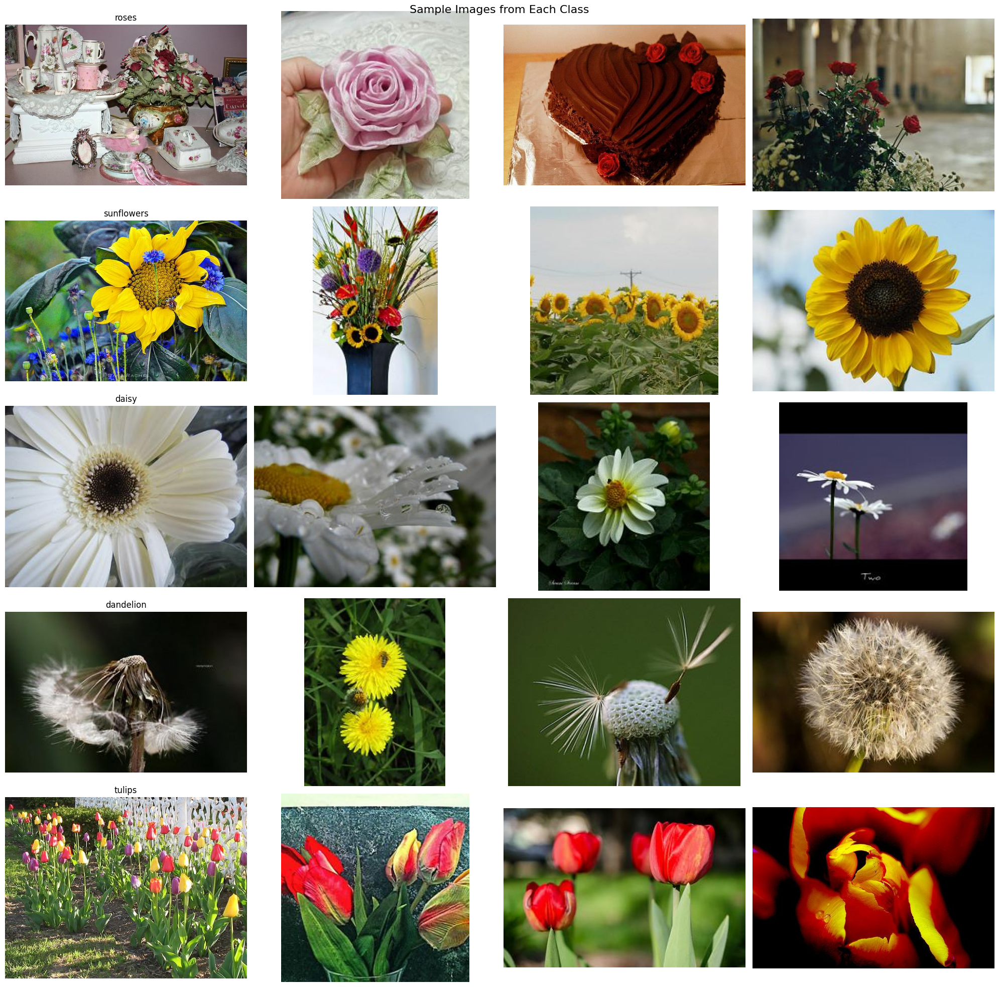

In [19]:

# Get unique classes
classes = df['label'].unique()

# Number of images to display per class
n_images = 4

# Set up the plot
fig, axes = plt.subplots(len(classes), n_images, figsize=(20, 4*len(classes)))
fig.suptitle('Sample Images from Each Class', fontsize=16)

for i, class_name in enumerate(classes):
    # Filter dataframe for current class
    class_df = df[df['label'] == class_name]

    # Randomly sample n_images from this class
    sample_images = class_df['image_path'].sample(n_images).tolist()

    for j, img_path in enumerate(sample_images):
        # Open and display the image
        img = Image.open(img_path)
        axes[i, j].imshow(img)
        axes[i, j].axis('off')

        # Set the title for the first image in each row
        if j == 0:
            axes[i, j].set_title(f'{class_name}', fontsize=12)

plt.tight_layout()
plt.show()

In [20]:
test_ratio = 0.20 # 20% of data will go to test

# split the data
# 1. Split off the TEST set (e.g., 10%)
# Remaining data (90%) will be split again
train_val_df, test_df = train_test_split(
    df, test_size=0.10, stratify=df['label'], random_state=42
)

# 2. Split the remaining 90% into TRAIN (e.g., ~80% total) and VALIDATION (e.g., ~10% total)
# 0.111 of 90% is roughly 10% of the total original data
train_df, val_df = train_test_split(
    train_val_df, test_size=0.111, stratify=train_val_df['label'], random_state=42
)
print(f"Original dataset shape: {df.shape}")
print(f"Train size: {len(train_df)}")
print(f"Val size: {len(val_df)}")
print(f"Test size: {len(test_df)}")


# Print class distribution
print("\nClass distribution:")
print("Original:")
print(df['label'].value_counts(normalize=True))
print("\nTrain:")
print(train_df['label'].value_counts(normalize=True))
print("\nTest:")
print(test_df['label'].value_counts(normalize=True))

Original dataset shape: (3670, 2)
Train size: 2936
Val size: 367
Test size: 367

Class distribution:
Original:
label
dandelion     0.244687
tulips        0.217711
sunflowers    0.190463
roses         0.174659
daisy         0.172480
Name: proportion, dtype: float64

Train:
label
dandelion     0.244550
tulips        0.217643
sunflowers    0.190395
roses         0.174728
daisy         0.172684
Name: proportion, dtype: float64

Test:
label
dandelion     0.245232
tulips        0.217984
sunflowers    0.190736
roses         0.174387
daisy         0.171662
Name: proportion, dtype: float64


In [21]:
IMAGE_SIZE = 128

# this will be used during training, this will hold all the augmentation/transformation configs
training_transform = transforms.Compose([transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
                                             transforms.ToTensor(),
                                         transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

# this will be used during testing / infernece, wo don't want any kind of additional transformation applied at the time of running model prediction in test / production inviroment
test_transform = transforms.Compose([transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
                                             transforms.ToTensor(),
                                     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

     

In [22]:
# list of classes in your dataset
CLASS_LIST = ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']
label_to_idx = {label: idx for idx, label in enumerate(CLASS_LIST)}


In [33]:
# Define custom Dataset -> this will help you load images from your csv file
class CustomTrainingData(Dataset):
    def __init__(self, csv_df, class_list, transform=None):
        self.df = csv_df
        self.transform = transform
        self.class_list = class_list

    def __len__(self):
        return self.df.shape[0]

    def __getitem__(self, index):
        image = Image.open(self.df.iloc[index].image_path).convert('RGB')
        label = self.class_list.index(self.df.iloc[index].label)

        if self.transform:
            image = self.transform(image)

        return image, label


train_datasetNT = CustomTrainingData(train_df, CLASS_LIST, training_transform)
val_datasetNT = CustomTrainingData(val_df, CLASS_LIST, test_transform) 
test_datasetNT = CustomTrainingData(test_df, CLASS_LIST, test_transform)
BATCH_SIZE = 32
train_loaderNT = DataLoader(train_datasetNT, batch_size=BATCH_SIZE, shuffle=True)
val_loaderNT = DataLoader(val_datasetNT, batch_size=BATCH_SIZE, shuffle=False)
test_loaderNT = DataLoader(test_datasetNT, batch_size=BATCH_SIZE, shuffle=False)
     

In [34]:
class ImageClassifier(nn.Module):
    def __init__(self, num_classes, input_size=(128, 128), channels=3):
        super(ImageClassifier, self).__init__()

        self.input_size = input_size
        self.channels = channels

        # Convolutional layers
        self.conv1 = nn.Conv2d(channels, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, padding=1)

        # Batch normalization layers
        self.bn1 = nn.BatchNorm2d(32)
        self.bn2 = nn.BatchNorm2d(64)
        self.bn3 = nn.BatchNorm2d(128)
        self.bn4 = nn.BatchNorm2d(256)

        # Max pooling layer
        self.pool = nn.MaxPool2d(2, 2)

        # Dropout layer
        self.dropout = nn.Dropout(0.5)

        # Calculate the size of the flattened features
        self._to_linear = None
        self._calculate_to_linear(input_size)

        # Fully connected layers
        self.fc1 = nn.Linear(self._to_linear, 512)
        self.fc2 = nn.Linear(512, num_classes)

    def _calculate_to_linear(self, input_size):
        # This function calculates the size of the flattened features
        x = torch.randn(1, self.channels, *input_size)
        self.conv_forward(x)

    def conv_forward(self, x):
        x = self.pool(F.relu(self.bn1(self.conv1(x))))
        x = self.pool(F.relu(self.bn2(self.conv2(x))))
        x = self.pool(F.relu(self.bn3(self.conv3(x))))
        x = self.pool(F.relu(self.bn4(self.conv4(x))))

        if self._to_linear is None:
            self._to_linear = x[0].shape[0] * x[0].shape[1] * x[0].shape[2]
        return x

    def forward(self, x):
        x = self.conv_forward(x)

        # Flatten the output for the fully connected layer
        x = x.view(-1, self._to_linear)

        # Fully connected layers with ReLU and dropout
        x = self.dropout(F.relu(self.fc1(x)))
        x = self.fc2(x)

        return x
     

In [35]:
# Hyperparameters
BATCH_SIZE = 32
EPOCHS = 100
LEARNING_RATE = 0.001
NUM_CLASSES = len(CLASS_LIST)
INPUT_SIZE = (IMAGE_SIZE, IMAGE_SIZE)
CHANNELS = 3

In [36]:
# Initialize the model
modelNT = ImageClassifier(NUM_CLASSES, INPUT_SIZE, CHANNELS).to(device)

# Loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(modelNT.parameters(), lr=LEARNING_RATE)

In [37]:
# Print model summary
print(modelNT)

# If you want to see the number of parameters
total_params = sum(p.numel() for p in modelNT.parameters())
print(f"Total number of parameters: {total_params}")

# Test with a random input
test_input = torch.randn(1, CHANNELS, *INPUT_SIZE).to(device)
output = modelNT(test_input)
print(f"Output shape: {output.shape}")

ImageClassifier(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc1): Linear(in_features=16384, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=5, bias=True)
)
Total number of parameters: 8781061
Output shape: torch.Size(

In [38]:
history = {
    'train_loss': [], 'val_loss': [],
    'train_acc': [], 'val_acc': []
}
for epoch in range(EPOCHS):
    modelNT.train()
    train_loss = 0.0
    correct_train = 0
    total_train = 0
    for images, labels in train_loaderNT:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = modelNT(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    avg_train_loss = train_loss / len(train_loader)
    train_acc = correct_train / total_train
    
    # --- VALIDATION ---
    modelNT.eval()
    val_loss = 0.0
    correct_val = 0
    total_val = 0
    
    with torch.no_grad():
        for images, labels in val_loaderNT:
            images, labels = images.to(device), labels.to(device)
            outputs = modelNT(images)
            loss = criterion(outputs, labels)
            
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total_val += labels.size(0)
            correct_val += (predicted == labels).sum().item()
            
    avg_val_loss = val_loss / len(val_loaderNT)
    val_acc = correct_val / total_val
    
    # Store history
    history['train_loss'].append(avg_train_loss)
    history['val_loss'].append(avg_val_loss)
    history['train_acc'].append(train_acc)
    history['val_acc'].append(val_acc)
    
    print(f"Epoch {epoch+1}: Train Loss {avg_train_loss:.4f} | Val Loss {avg_val_loss:.4f} | Val Acc {val_acc:.4f}")

     

Epoch 1: Train Loss 2.2669 | Val Loss 1.1142 | Val Acc 0.5095
Epoch 2: Train Loss 1.1328 | Val Loss 1.1315 | Val Acc 0.4959
Epoch 3: Train Loss 1.0795 | Val Loss 1.0740 | Val Acc 0.5804
Epoch 4: Train Loss 1.0188 | Val Loss 0.9564 | Val Acc 0.6131
Epoch 5: Train Loss 0.9942 | Val Loss 1.0363 | Val Acc 0.6131
Epoch 6: Train Loss 0.9260 | Val Loss 1.0822 | Val Acc 0.6022
Epoch 7: Train Loss 0.9041 | Val Loss 1.1143 | Val Acc 0.6049
Epoch 8: Train Loss 0.8695 | Val Loss 1.0336 | Val Acc 0.6403
Epoch 9: Train Loss 0.8128 | Val Loss 1.0607 | Val Acc 0.6022
Epoch 10: Train Loss 0.8172 | Val Loss 0.9235 | Val Acc 0.6131
Epoch 11: Train Loss 0.7714 | Val Loss 0.9754 | Val Acc 0.6594
Epoch 12: Train Loss 0.7534 | Val Loss 0.8383 | Val Acc 0.7030
Epoch 13: Train Loss 0.7370 | Val Loss 0.9413 | Val Acc 0.6676
Epoch 14: Train Loss 0.6801 | Val Loss 0.9012 | Val Acc 0.6975
Epoch 15: Train Loss 0.6419 | Val Loss 0.8543 | Val Acc 0.7112
Epoch 16: Train Loss 0.6152 | Val Loss 1.0627 | Val Acc 0.6921
E

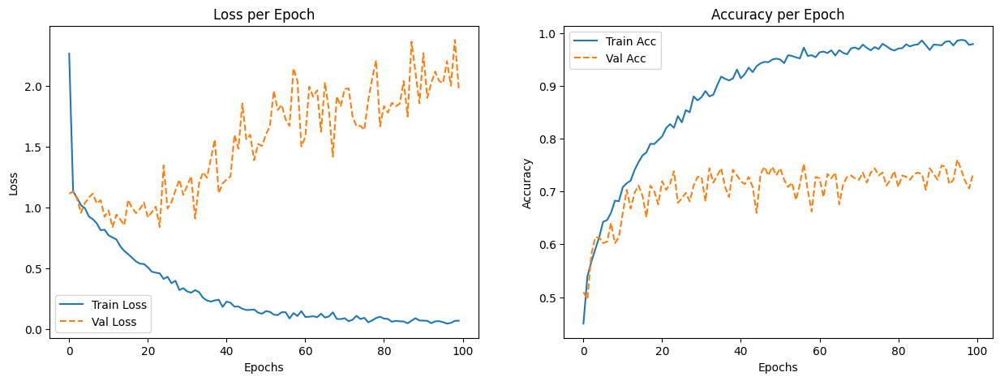

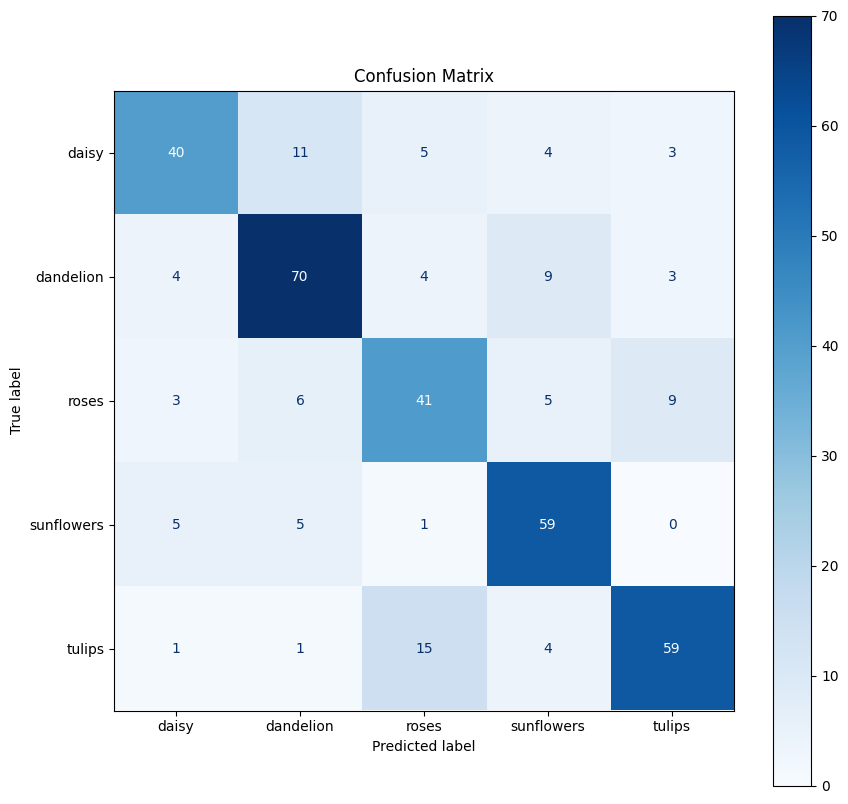

In [39]:
# 1. Plot Loss and Accuracy
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

# Loss Plot
ax[0].plot(history['train_loss'], label='Train Loss')
ax[0].plot(history['val_loss'], label='Val Loss', linestyle='--')
ax[0].set_title('Loss per Epoch')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].legend()

# Accuracy Plot
ax[1].plot(history['train_acc'], label='Train Acc')
ax[1].plot(history['val_acc'], label='Val Acc', linestyle='--')
ax[1].set_title('Accuracy per Epoch')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Accuracy')
ax[1].legend()

plt.show()

# 2. Confusion Matrix (on Validation or Test Set)
# We use the best model state here ideally
modelNT.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in val_loaderNT: # Or test_loader
        images, labels = images.to(device), labels.to(device)
        outputs = modelNT(images)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_LIST)
fig, ax = plt.subplots(figsize=(10, 10))
disp.plot(cmap='Blues', ax=ax)
plt.title('Confusion Matrix')
plt.show()

In [40]:
modelNT.to(device)
modelNT.eval()

y_true = []
y_pred = []

with torch.no_grad():  # Save memory, don't calculate gradients
    for images, labels in test_loaderNT:  # Use test_loader here!
        images = images.to(device)
        labels = labels.to(device)
        
        # Forward pass
        outputs = modelNT(images)
        
        # Get predictions
        _, predicted = torch.max(outputs, 1)
        
        # Move to CPU and convert to numpy for sklearn
        y_pred.extend(predicted.cpu().numpy())
        y_true.extend(labels.cpu().numpy())

# 4. Calculate Macro F1
macro_f1 = f1_score(y_true, y_pred, average='macro')
print(f'Final Test Set Macro F1 Score: {macro_f1:.4f}')

Final Test Set Macro F1 Score: 0.7955


10 epochs : (1min) 
    Macro F1 Score: 0.6342608281458604
50 epochs : (5min)
    Macro F1 Score: 0.7308830796216569
70 epochs : (7min)
    Macro F1 Score: 0.7689266024415194
100 epochs : (10min)
    Final Test Set Macro F1 Score: 0.7955 
    little transform


In [ ]:

image_path_list = []
label_list = []

for class_cat in os.listdir("tf_flowers_images"):
    if class_cat.startswith("."):  
        continue
    for image_object in os.listdir(f"tf_flowers_images/{class_cat}"):
        if image_object.startswith("."):
            continue
        image_path_list.append(f"tf_flowers_images/{class_cat}/{image_object}")
        label_list.append(class_cat)
df = pd.DataFrame()

df["image_path"] = image_path_list
df["label"] = label_list

df

classes = df['label'].unique()

train_val_df, test_df = train_test_split(
    df, test_size=0.10, stratify=df['label'], random_state=42
)

# 2. Split the remaining 90% into TRAIN (e.g., ~80% total) and VALIDATION (e.g., ~10% total)
# 0.111 of 90% is roughly 10% of the total original data
train_df, val_df = train_test_split(
    train_val_df, test_size=0.111, stratify=train_val_df['label'], random_state=42
)

print(f"Original dataset shape: {df.shape}")
print(f"Train size: {len(train_df)}")
print(f"Val size: {len(val_df)}")
print(f"Test size: {len(test_df)}")


print("\nClass distribution:")
print("Original:")
print(df['label'].value_counts(normalize=True))
print("\nTrain:")
print(train_df['label'].value_counts(normalize=True))
print("\nTest:")
print(test_df['label'].value_counts(normalize=True))

# %%
IMAGE_SIZE = 124

# this will be used during training, this will hold all the augmentation/transformation configs
training_transform = transforms.Compose([transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
                                             transforms.ToTensor(),
                                         transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

# this will be used during testing / infernece, wo don't want any kind of additional transformation applied at the time of running model prediction in test / production inviroment
test_transform = transforms.Compose([transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
                                             transforms.ToTensor(),
                                     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
TRANSFORMS = transforms.Compose([
    transforms.RandomRotation(30),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(),
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5),
                         (0.5, 0.5, 0.5)),
])
     

# %%
# list of classes in your dataset
CLASS_LIST = ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

Original dataset shape: (3670, 2)
Train size: 2936
Val size: 367
Test size: 367

Class distribution:
Original:
label
dandelion     0.244687
tulips        0.217711
sunflowers    0.190463
roses         0.174659
daisy         0.172480
Name: proportion, dtype: float64

Train:
label
dandelion     0.244550
tulips        0.217643
sunflowers    0.190395
roses         0.174728
daisy         0.172684
Name: proportion, dtype: float64

Test:
label
dandelion     0.245232
tulips        0.217984
sunflowers    0.190736
roses         0.174387
daisy         0.171662
Name: proportion, dtype: float64


In [ ]:
# Define custom Dataset -> this will help you load images from your csv file
class CustomTrainingData(Dataset):
    def __init__(self, csv_df, class_list, transform=None):
        self.df = csv_df
        self.transform = transform
        self.class_list = class_list

    def __len__(self):
        return self.df.shape[0]

    def __getitem__(self, index):
        image = Image.open(self.df.iloc[index].image_path).convert('RGB')
        label = self.class_list.index(self.df.iloc[index].label)

        if self.transform:
            image = self.transform(image)

        return image, label

BATCH_SIZE = 32
# Create Datasets & Loaders
# Note: Validation uses Test Transforms (No augmentation!)
train_datasetT = CustomTrainingData(train_df, CLASS_LIST, TRANSFORMS)
val_datasetT = CustomTrainingData(val_df, CLASS_LIST, TRANSFORMS) 
test_datasetT = CustomTrainingData(test_df, CLASS_LIST, TRANSFORMS)

train_loaderT = DataLoader(train_datasetT, batch_size=BATCH_SIZE, shuffle=True)
val_loaderT = DataLoader(val_datasetT, batch_size=BATCH_SIZE, shuffle=False)
test_loaderT = DataLoader(test_datasetT, batch_size=BATCH_SIZE, shuffle=False)
     



In [48]:
class ImageClassifier(nn.Module):
    def __init__(self, num_classes, input_size=(IMAGE_SIZE, IMAGE_SIZE), channels=3):
        super(ImageClassifier, self).__init__()

        self.input_size = input_size
        self.channels = channels

        self.conv1 = nn.Conv2d(channels, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, padding=1)

        self.bn1 = nn.BatchNorm2d(32)
        self.bn2 = nn.BatchNorm2d(64)
        self.bn3 = nn.BatchNorm2d(128)
        self.bn4 = nn.BatchNorm2d(256)

        self.pool = nn.MaxPool2d(2, 2)

        self.dropout = nn.Dropout(0.5)

        self._to_linear = None
        self._calculate_to_linear(input_size)

        self.fc1 = nn.Linear(self._to_linear, 512)
        self.fc2 = nn.Linear(512, num_classes)

    def _calculate_to_linear(self, input_size):
        x = torch.randn(1, self.channels, *input_size)
        self.conv_forward(x)

    def conv_forward(self, x):
        x = self.pool(F.relu(self.bn1(self.conv1(x))))
        x = self.pool(F.relu(self.bn2(self.conv2(x))))
        x = self.pool(F.relu(self.bn3(self.conv3(x))))
        x = self.pool(F.relu(self.bn4(self.conv4(x))))

        if self._to_linear is None:
            self._to_linear = x[0].shape[0] * x[0].shape[1] * x[0].shape[2]
        return x

    def forward(self, x):
        x = self.conv_forward(x)

        # Flatten the output for the fully connected layer
        x = x.view(-1, self._to_linear)

        # Fully connected layers with ReLU and dropout
        x = self.dropout(F.relu(self.fc1(x)))
        x = self.fc2(x)

        return x
     

In [49]:
# Hyperparameters
BATCH_SIZE = 32
EPOCHS = 100
LEARNING_RATE = 0.001
NUM_CLASSES = len(CLASS_LIST)
INPUT_SIZE = (IMAGE_SIZE, IMAGE_SIZE)
CHANNELS = 3

# %%
# Initialize the model
modelT = ImageClassifier(NUM_CLASSES, INPUT_SIZE, CHANNELS).to(device)

# Loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(modelT.parameters(), lr=LEARNING_RATE)

# %%
# Print model summary
print(modelT)

# If you want to see the number of parameters
total_params = sum(p.numel() for p in modelT.parameters())
print(f"Total number of parameters: {total_params}")

# Test with a random input
test_input = torch.randn(1, CHANNELS, *INPUT_SIZE).to(device)
output = modelT(test_input)
print(f"Output shape: {output.shape}")

ImageClassifier(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc1): Linear(in_features=12544, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=5, bias=True)
)
Total number of parameters: 6814981
Output shape: torch.Size(

In [ ]:
history = {
    'train_loss': [], 'val_loss': [],
    'train_acc': [], 'val_acc': []
}
# Training loop
for epoch in range(EPOCHS):
    modelT.train()
    train_loss = 0.0
    correct_train = 0
    total_train = 0
    for images, labels in train_loaderT:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = modelT(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    avg_train_loss = train_loss / len(train_loaderT)
    train_acc = correct_train / total_train
    
    # --- VALIDATION ---
    modelT.eval()
    val_loss = 0.0
    correct_val = 0
    total_val = 0
    
    with torch.no_grad():
        for images, labels in val_loaderT:
            images, labels = images.to(device), labels.to(device)
            outputs = modelT(images)
            loss = criterion(outputs, labels)
            
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total_val += labels.size(0)
            correct_val += (predicted == labels).sum().item()
            
    avg_val_loss = val_loss / len(val_loaderT)
    val_acc = correct_val / total_val
    
    # Store history
    history['train_loss'].append(avg_train_loss)
    history['val_loss'].append(avg_val_loss)
    history['train_acc'].append(train_acc)
    history['val_acc'].append(val_acc)
    
    print(f"Epoch {epoch+1}: Train Loss {avg_train_loss:.4f} | Val Loss {avg_val_loss:.4f} | Val Acc {val_acc:.4f}")

Epoch 1: Train Loss 0.5826 | Val Loss 0.7815 | Val Acc 0.7493
Epoch 2: Train Loss 0.5556 | Val Loss 0.7682 | Val Acc 0.7248
Epoch 3: Train Loss 0.5580 | Val Loss 0.8079 | Val Acc 0.7330
Epoch 4: Train Loss 0.5281 | Val Loss 0.8411 | Val Acc 0.7003
Epoch 5: Train Loss 0.5191 | Val Loss 0.7976 | Val Acc 0.7330
Epoch 6: Train Loss 0.4856 | Val Loss 0.9815 | Val Acc 0.6894
Epoch 7: Train Loss 0.5104 | Val Loss 0.8043 | Val Acc 0.7330
Epoch 8: Train Loss 0.4876 | Val Loss 0.7869 | Val Acc 0.7411
Epoch 9: Train Loss 0.4598 | Val Loss 0.7950 | Val Acc 0.7302
Epoch 10: Train Loss 0.4689 | Val Loss 0.8437 | Val Acc 0.7384
Epoch 11: Train Loss 0.4457 | Val Loss 0.8670 | Val Acc 0.7193
Epoch 12: Train Loss 0.4230 | Val Loss 0.7388 | Val Acc 0.7493
Epoch 13: Train Loss 0.4538 | Val Loss 0.7402 | Val Acc 0.7684
Epoch 14: Train Loss 0.4084 | Val Loss 0.6736 | Val Acc 0.7548
Epoch 15: Train Loss 0.4048 | Val Loss 0.8011 | Val Acc 0.7384
Epoch 16: Train Loss 0.3869 | Val Loss 0.7606 | Val Acc 0.7384
E

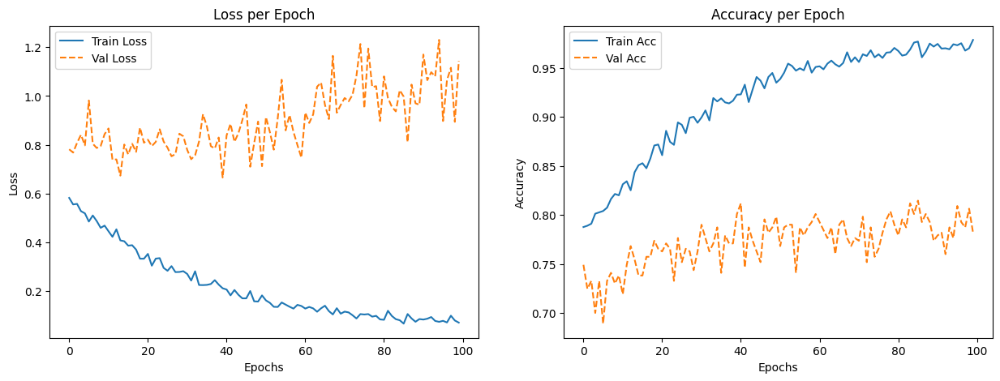

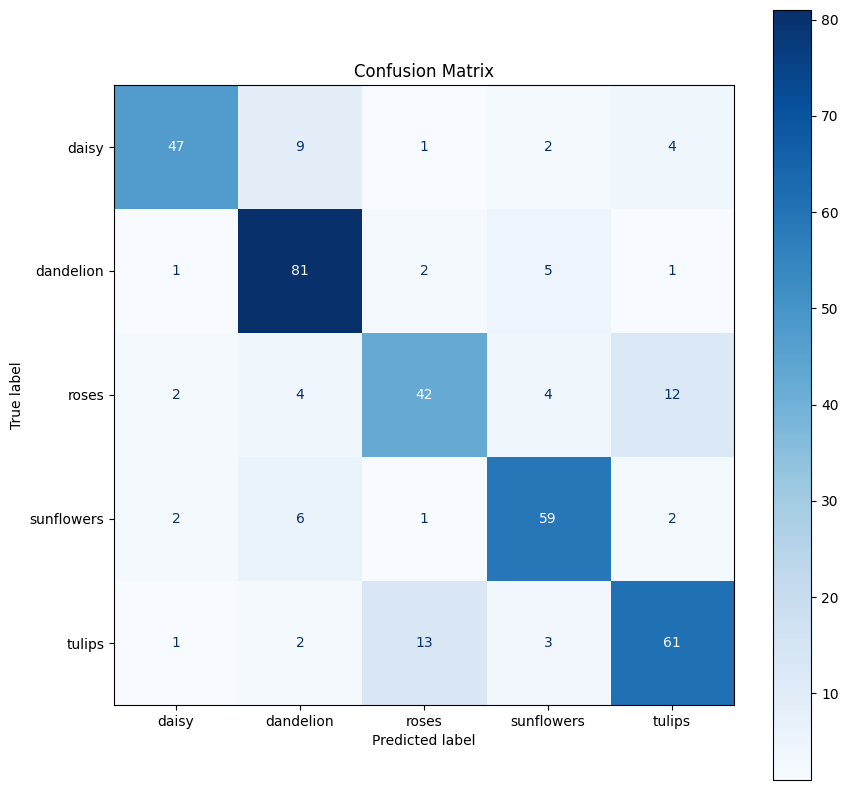

In [52]:
# 1. Plot Loss and Accuracy
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

# Loss Plot
ax[0].plot(history['train_loss'], label='Train Loss')
ax[0].plot(history['val_loss'], label='Val Loss', linestyle='--')
ax[0].set_title('Loss per Epoch')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].legend()

# Accuracy Plot
ax[1].plot(history['train_acc'], label='Train Acc')
ax[1].plot(history['val_acc'], label='Val Acc', linestyle='--')
ax[1].set_title('Accuracy per Epoch')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Accuracy')
ax[1].legend()

plt.show()

# 2. Confusion Matrix (on Validation or Test Set)
# We use the best model state here ideally
modelT.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in val_loaderT: # Or test_loader
        images, labels = images.to(device), labels.to(device)
        outputs = modelT(images)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_LIST)
fig, ax = plt.subplots(figsize=(10, 10))
disp.plot(cmap='Blues', ax=ax)
plt.title('Confusion Matrix')
plt.show()

In [53]:
modelT.to(device)
modelT.eval()

y_true = []
y_pred = []

for images, labels in test_loaderT:
    images = images.to(device)
    outputs = modelT(images)
    _, predicted = torch.max(outputs, 1)
    y_pred.extend(predicted.cpu().numpy())
    y_true.extend(labels.cpu().numpy())

f1 = f1_score(y_true, y_pred, average='macro')

print(f'Macro F1 Score: {f1}')

Macro F1 Score: 0.815091607067836


10 epochs : (1min)
    Macro F1 Score: 0.6793004942104667
50 epochs : (5min)
    Macro F1 Score: 0.8016273544098269
100 epochs : (13min)
    Macro F1 Score: 0.8051268069054853
    Macro F1 Score: 0.815091607067836


In [54]:
image_path_list = []
label_list = []

for class_cat in os.listdir("tf_flowers_images"):
    if class_cat.startswith("."):   # ignore system files
        continue
    for image_object in os.listdir(f"tf_flowers_images/{class_cat}"):
        if image_object.startswith("."):
            continue
        image_path_list.append(f"tf_flowers_images/{class_cat}/{image_object}")
        label_list.append(class_cat)
df = pd.DataFrame()

df["image_path"] = image_path_list
df["label"] = label_list

df

classes = df['label'].unique()


# split the data
# 1. Split off the TEST set (e.g., 10%)
# Remaining data (90%) will be split again
train_val_df, test_df = train_test_split(
    df, test_size=0.10, stratify=df['label'], random_state=42
)

# 2. Split the remaining 90% into TRAIN (e.g., ~80% total) and VALIDATION (e.g., ~10% total)
# 0.111 of 90% is roughly 10% of the total original data
train_df, val_df = train_test_split(
    train_val_df, test_size=0.111, stratify=train_val_df['label'], random_state=42
)
print(f"Original dataset shape: {df.shape}")
print(f"Train size: {len(train_df)}")
print(f"Val size: {len(val_df)}")
print(f"Test size: {len(test_df)}")


# Print class distribution
print("\nClass distribution:")
print("Original:")
print(df['label'].value_counts(normalize=True))
print("\nTrain:")
print(train_df['label'].value_counts(normalize=True))
print("\nTest:")
print(test_df['label'].value_counts(normalize=True))

# %%
IMAGE_SIZE = 124

# this will be used during training, this will hold all the augmentation/transformation configs
training_transform = transforms.Compose([transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
                                             transforms.ToTensor(),
                                         transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

# this will be used during testing / infernece, wo don't want any kind of additional transformation applied at the time of running model prediction in test / production inviroment
test_transform = transforms.Compose([transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
                                             transforms.ToTensor(),
                                     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
TRANSFORMS = transforms.Compose([
    transforms.RandomRotation(30),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(),
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5),
                         (0.5, 0.5, 0.5)),
])
     

# %%
# list of classes in your dataset
CLASS_LIST = ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

Original dataset shape: (3670, 2)
Train size: 2936
Val size: 367
Test size: 367

Class distribution:
Original:
label
dandelion     0.244687
tulips        0.217711
sunflowers    0.190463
roses         0.174659
daisy         0.172480
Name: proportion, dtype: float64

Train:
label
dandelion     0.244550
tulips        0.217643
sunflowers    0.190395
roses         0.174728
daisy         0.172684
Name: proportion, dtype: float64

Test:
label
dandelion     0.245232
tulips        0.217984
sunflowers    0.190736
roses         0.174387
daisy         0.171662
Name: proportion, dtype: float64


In [55]:
# Define custom Dataset -> this will help you load images from your csv file
class CustomTrainingData(Dataset):
    def __init__(self, csv_df, class_list, transform=None):
        self.df = csv_df
        self.transform = transform
        self.class_list = class_list

    def __len__(self):
        return self.df.shape[0]

    def __getitem__(self, index):
        image = Image.open(self.df.iloc[index].image_path).convert('RGB')
        label = self.class_list.index(self.df.iloc[index].label)

        if self.transform:
            image = self.transform(image)

        return image, label

BATCH_SIZE = 32
train_datasetT = CustomTrainingData(train_df, CLASS_LIST, TRANSFORMS)
val_datasetT = CustomTrainingData(val_df, CLASS_LIST, TRANSFORMS) 
test_datasetT = CustomTrainingData(test_df, CLASS_LIST, TRANSFORMS)

train_loaderT = DataLoader(train_datasetT, batch_size=BATCH_SIZE, shuffle=True)
val_loaderT = DataLoader(val_datasetT, batch_size=BATCH_SIZE, shuffle=False)
test_loaderT = DataLoader(test_datasetT, batch_size=BATCH_SIZE, shuffle=False)
     


In [ ]:
class ImageClassifierNoPool(nn.Module):
    def __init__(self, num_classes, input_size=(IMAGE_SIZE, IMAGE_SIZE), channels=3):
        super(ImageClassifierNoPool, self).__init__()

        self.input_size = input_size
        self.channels = channels

        # Use stride=2 to downsample instead of MaxPool
        self.conv1 = nn.Conv2d(channels, 32, kernel_size=3, padding=1, stride=2)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1, stride=2)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1, stride=2)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, padding=1, stride=2)

        self.bn1 = nn.BatchNorm2d(32)
        self.bn2 = nn.BatchNorm2d(64)
        self.bn3 = nn.BatchNorm2d(128)
        self.bn4 = nn.BatchNorm2d(256)

        # Removed self.pool definition

        self.dropout = nn.Dropout(0.5)

        self._to_linear = None
        self._calculate_to_linear(input_size)

        self.fc1 = nn.Linear(self._to_linear, 512)
        self.fc2 = nn.Linear(512, num_classes)

    def _calculate_to_linear(self, input_size):
        x = torch.randn(1, self.channels, *input_size)
        self.conv_forward(x)

    def conv_forward(self, x):
        # Removed self.pool() calls
        x = F.relu(self.bn1(self.conv1(x)))
        x = F.relu(self.bn2(self.conv2(x)))
        x = F.relu(self.bn3(self.conv3(x)))
        x = F.relu(self.bn4(self.conv4(x)))

        if self._to_linear is None:
            self._to_linear = x[0].shape[0] * x[0].shape[1] * x[0].shape[2]
        return x

    def forward(self, x):
        x = self.conv_forward(x)
        x = x.view(x.size(0), -1)
        x = self.dropout(F.relu(self.fc1(x)))
        x = self.fc2(x)
        return x

In [57]:
# Hyperparameters
BATCH_SIZE = 32
EPOCHS = 50
LEARNING_RATE = 0.001
NUM_CLASSES = len(CLASS_LIST)
INPUT_SIZE = (IMAGE_SIZE, IMAGE_SIZE)
CHANNELS = 3

# %%
# Initialize the model
modelNP = ImageClassifierNoPool(NUM_CLASSES, INPUT_SIZE, CHANNELS).to(device)

# Loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(modelNP.parameters(), lr=LEARNING_RATE)

# %%
# Print model summary
print(modelNP)

# If you want to see the number of parameters
total_params = sum(p.numel() for p in modelNP.parameters())
print(f"Total number of parameters: {total_params}")

# Test with a random input
test_input = torch.randn(1, CHANNELS, *INPUT_SIZE).to(device)
output = modelNP(test_input)
print(f"Output shape: {output.shape}")

ImageClassifierNoPool(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc1): Linear(in_features=16384, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=5, bias=True)
)
Total number of parameters: 8781061
Output shape: torch.Size([1, 5])


In [61]:
history = {
    'train_loss': [], 'val_loss': [],
    'train_acc': [], 'val_acc': []
}
# Training loop
for epoch in range(EPOCHS):
    modelNP.train()
    train_loss = 0.0
    correct_train = 0
    total_train = 0
    for images, labels in train_loaderT:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = modelNP(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    avg_train_loss = train_loss / len(train_loaderT)
    train_acc = correct_train / total_train
    
    # --- VALIDATION ---
    modelNP.eval()
    val_loss = 0.0
    correct_val = 0
    total_val = 0
    
    with torch.no_grad():
        for images, labels in val_loaderT:
            images, labels = images.to(device), labels.to(device)
            outputs = modelNP(images)
            loss = criterion(outputs, labels)
            
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total_val += labels.size(0)
            correct_val += (predicted == labels).sum().item()
            
    avg_val_loss = val_loss / len(val_loaderT)
    val_acc = correct_val / total_val
    
    # Store history
    history['train_loss'].append(avg_train_loss)
    history['val_loss'].append(avg_val_loss)
    history['train_acc'].append(train_acc)
    history['val_acc'].append(val_acc)
    
    print(f"Epoch {epoch+1}: Train Loss {avg_train_loss:.4f} | Val Loss {avg_val_loss:.4f} | Val Acc {val_acc:.4f}")

Epoch 1: Train Loss 0.4209 | Val Loss 0.9205 | Val Acc 0.7139
Epoch 2: Train Loss 0.4148 | Val Loss 0.9995 | Val Acc 0.7139
Epoch 3: Train Loss 0.3877 | Val Loss 0.8830 | Val Acc 0.7193
Epoch 4: Train Loss 0.4105 | Val Loss 0.8086 | Val Acc 0.7357
Epoch 5: Train Loss 0.3909 | Val Loss 0.9269 | Val Acc 0.7466
Epoch 6: Train Loss 0.3907 | Val Loss 0.9007 | Val Acc 0.7275
Epoch 7: Train Loss 0.3663 | Val Loss 1.0587 | Val Acc 0.6812
Epoch 8: Train Loss 0.3751 | Val Loss 0.8990 | Val Acc 0.7248
Epoch 9: Train Loss 0.3510 | Val Loss 0.8131 | Val Acc 0.7411
Epoch 10: Train Loss 0.3817 | Val Loss 0.8768 | Val Acc 0.7166
Epoch 11: Train Loss 0.3656 | Val Loss 1.0366 | Val Acc 0.7193
Epoch 12: Train Loss 0.3421 | Val Loss 0.9257 | Val Acc 0.7302
Epoch 13: Train Loss 0.3623 | Val Loss 0.8124 | Val Acc 0.7466
Epoch 14: Train Loss 0.3402 | Val Loss 1.0062 | Val Acc 0.7520
Epoch 15: Train Loss 0.3257 | Val Loss 1.0289 | Val Acc 0.7439
Epoch 16: Train Loss 0.3302 | Val Loss 1.0350 | Val Acc 0.7330
E

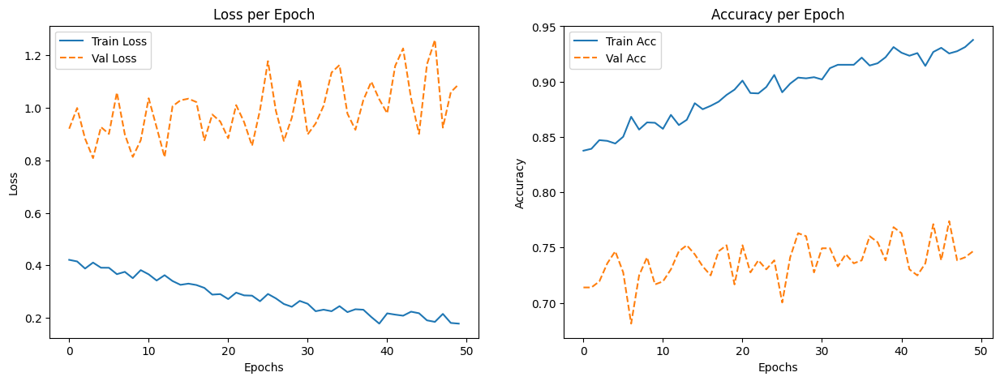

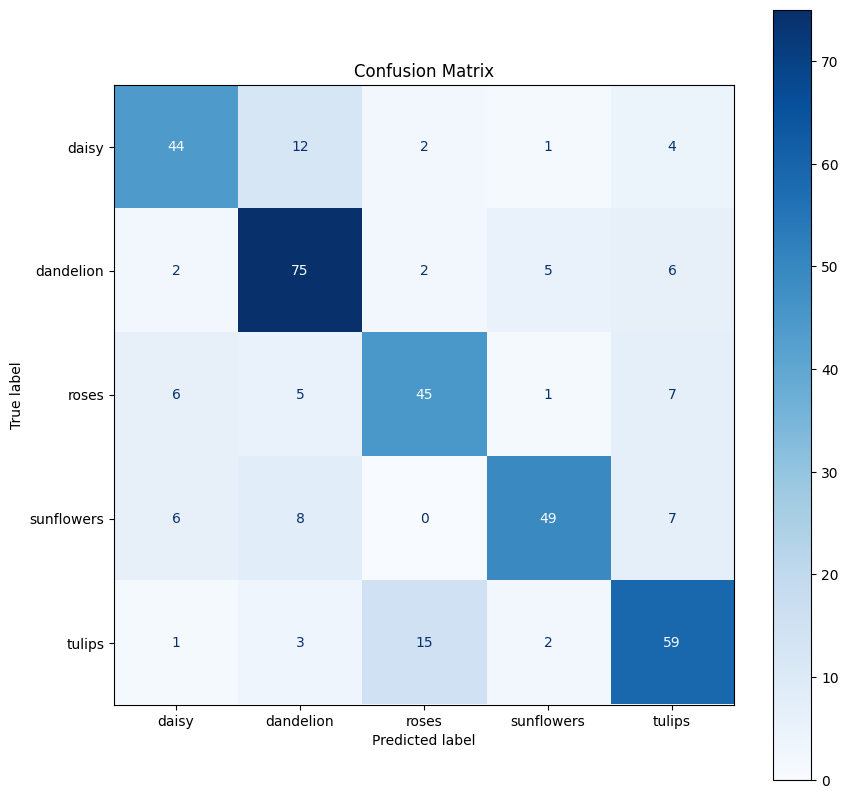

In [62]:
# 1. Plot Loss and Accuracy
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

# Loss Plot
ax[0].plot(history['train_loss'], label='Train Loss')
ax[0].plot(history['val_loss'], label='Val Loss', linestyle='--')
ax[0].set_title('Loss per Epoch')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].legend()

# Accuracy Plot
ax[1].plot(history['train_acc'], label='Train Acc')
ax[1].plot(history['val_acc'], label='Val Acc', linestyle='--')
ax[1].set_title('Accuracy per Epoch')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Accuracy')
ax[1].legend()

plt.show()

# 2. Confusion Matrix (on Validation or Test Set)
# We use the best model state here ideally
modelNP.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in val_loaderT: # Or test_loader
        images, labels = images.to(device), labels.to(device)
        outputs = modelNP(images)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_LIST)
fig, ax = plt.subplots(figsize=(10, 10))
disp.plot(cmap='Blues', ax=ax)
plt.title('Confusion Matrix')
plt.show()

In [63]:
modelNP.to(device)
modelNP.eval()

y_true = []
y_pred = []

for images, labels in test_loaderT:
    images = images.to(device)
    outputs = modelNP(images)
    _, predicted = torch.max(outputs, 1)
    y_pred.extend(predicted.cpu().numpy())
    y_true.extend(labels.cpu().numpy())

f1 = f1_score(y_true, y_pred, average='macro')

print(f'Macro F1 Score: {f1}')

Macro F1 Score: 0.8148317486316066


50 epochs : Macro F1 Score: 0.8148317486316066 - fara pooling


In [77]:
image_path_list = []
label_list = []

for class_cat in os.listdir("tf_flowers_images"):
    if class_cat.startswith("."):   # ignore system files
        continue
    for image_object in os.listdir(f"tf_flowers_images/{class_cat}"):
        if image_object.startswith("."):
            continue
        image_path_list.append(f"tf_flowers_images/{class_cat}/{image_object}")
        label_list.append(class_cat)
df = pd.DataFrame()

df["image_path"] = image_path_list
df["label"] = label_list

df


# Get unique classes
classes = df['label'].unique()

train_val_df, test_df = train_test_split(
    df, test_size=0.10, stratify=df['label'], random_state=42
)

# 2. Split the remaining 90% into TRAIN (e.g., ~80% total) and VALIDATION (e.g., ~10% total)
# 0.111 of 90% is roughly 10% of the total original data
train_df, val_df = train_test_split(
    train_val_df, test_size=0.111, stratify=train_val_df['label'], random_state=42
)

print(f"Original dataset shape: {df.shape}")
print(f"Train size: {len(train_df)}")
print(f"Val size: {len(val_df)}")
print(f"Test size: {len(test_df)}")



# Print class distribution
print("\nClass distribution:")
print("Original:")
print(df['label'].value_counts(normalize=True))
print("\nTrain:")
print(train_df['label'].value_counts(normalize=True))
print("\nTest:")
print(test_df['label'].value_counts(normalize=True))

# %%
IMAGE_SIZE = 124

# this will be used during training, this will hold all the augmentation/transformation configs
training_transform = transforms.Compose([transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
                                             transforms.ToTensor(),
                                         transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

# this will be used during testing / infernece, wo don't want any kind of additional transformation applied at the time of running model prediction in test / production inviroment
test_transform = transforms.Compose([transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
                                             transforms.ToTensor(),
                                     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
TRANSFORMS = transforms.Compose([
    transforms.RandomRotation(30),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(),
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5),
                         (0.5, 0.5, 0.5)),
])
     

# %%
# list of classes in your dataset
CLASS_LIST = ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

Original dataset shape: (3670, 2)
Train size: 2936
Val size: 367
Test size: 367

Class distribution:
Original:
label
dandelion     0.244687
tulips        0.217711
sunflowers    0.190463
roses         0.174659
daisy         0.172480
Name: proportion, dtype: float64

Train:
label
dandelion     0.244550
tulips        0.217643
sunflowers    0.190395
roses         0.174728
daisy         0.172684
Name: proportion, dtype: float64

Test:
label
dandelion     0.245232
tulips        0.217984
sunflowers    0.190736
roses         0.174387
daisy         0.171662
Name: proportion, dtype: float64


In [78]:
# Define custom Dataset -> this will help you load images from your csv file
class CustomTrainingData(Dataset):
    def __init__(self, csv_df, class_list, transform=None):
        self.df = csv_df
        self.transform = transform
        self.class_list = class_list

    def __len__(self):
        return self.df.shape[0]

    def __getitem__(self, index):
        image = Image.open(self.df.iloc[index].image_path).convert('RGB')
        label = self.class_list.index(self.df.iloc[index].label)

        if self.transform:
            image = self.transform(image)

        return image, label


BATCH_SIZE = 32
# Create Datasets & Loaders
# Note: Validation uses Test Transforms (No augmentation!)
train_datasetT = CustomTrainingData(train_df, CLASS_LIST, TRANSFORMS)
val_datasetT = CustomTrainingData(val_df, CLASS_LIST, TRANSFORMS) 
test_datasetT = CustomTrainingData(test_df, CLASS_LIST, TRANSFORMS)

train_loaderT = DataLoader(train_datasetT, batch_size=BATCH_SIZE, shuffle=True)
val_loaderT = DataLoader(val_datasetT, batch_size=BATCH_SIZE, shuffle=False)
test_loaderT = DataLoader(test_datasetT, batch_size=BATCH_SIZE, shuffle=False)
     



In [79]:
class ImageClassifier2H(nn.Module):
    def __init__(self, num_classes, input_size=(128, 128), channels=3):
        super(ImageClassifier2H, self).__init__()

        self.input_size = input_size
        self.channels = channels

        # Standard Convolutions (Same as original)
        self.conv1 = nn.Conv2d(channels, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, padding=1)

        self.bn1 = nn.BatchNorm2d(32)
        self.bn2 = nn.BatchNorm2d(64)
        self.bn3 = nn.BatchNorm2d(128)
        self.bn4 = nn.BatchNorm2d(256)

        self.pool = nn.MaxPool2d(2, 2)
        self.dropout = nn.Dropout(0.5)

        self._to_linear = None
        self._calculate_to_linear(input_size)

        # --- MODIFIED FULLY CONNECTED LAYERS ---
        self.fc1 = nn.Linear(self._to_linear, 512) # Hidden Layer 1
        self.fc2 = nn.Linear(512, 256)             # Hidden Layer 2 (New)
        self.fc3 = nn.Linear(256, num_classes)     # Output Layer

    def _calculate_to_linear(self, input_size):
        x = torch.randn(1, self.channels, *input_size)
        self.conv_forward(x)

    def conv_forward(self, x):
        x = self.pool(F.relu(self.bn1(self.conv1(x))))
        x = self.pool(F.relu(self.bn2(self.conv2(x))))
        x = self.pool(F.relu(self.bn3(self.conv3(x))))
        x = self.pool(F.relu(self.bn4(self.conv4(x))))

        if self._to_linear is None:
            self._to_linear = x[0].shape[0] * x[0].shape[1] * x[0].shape[2]
        return x

    def forward(self, x):
        x = self.conv_forward(x)
        x = x.view(x.size(0), -1)

        # Pass through Hidden Layer 1
        x = self.dropout(F.relu(self.fc1(x)))
        
        # Pass through Hidden Layer 2 (New)
        x = self.dropout(F.relu(self.fc2(x)))
        
        # Output Layer (No activation here, CrossEntropyLoss handles it)
        x = self.fc3(x)

        return x

In [80]:
# Hyperparameters
BATCH_SIZE = 32
EPOCHS = 100
LEARNING_RATE = 0.001
NUM_CLASSES = len(CLASS_LIST)
INPUT_SIZE = (IMAGE_SIZE, IMAGE_SIZE)
CHANNELS = 3

# %%
# Initialize the model
model2H = ImageClassifier2H(NUM_CLASSES, INPUT_SIZE, CHANNELS).to(device)

# Loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model2H.parameters(), lr=LEARNING_RATE)

# %%
# Print model summary
print(model2H)

# If you want to see the number of parameters
total_params = sum(p.numel() for p in model2H.parameters())
print(f"Total number of parameters: {total_params}")

# Test with a random input
test_input = torch.randn(1, CHANNELS, *INPUT_SIZE).to(device)
output = model2H(test_input)
print(f"Output shape: {output.shape}")

ImageClassifier2H(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc1): Linear(in_features=12544, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=256, bias=True)
  (fc3): Linear(in_features=256, out_features=5, bias=True)

In [81]:
history = {
    'train_loss': [], 'val_loss': [],
    'train_acc': [], 'val_acc': []
}
# Training loop
for epoch in range(EPOCHS):
    model2H.train()
    train_loss = 0.0
    correct_train = 0
    total_train = 0
    for images, labels in train_loaderT:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model2H(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    avg_train_loss = train_loss / len(train_loaderT)
    train_acc = correct_train / total_train
    
    # --- VALIDATION ---
    model2H.eval()
    val_loss = 0.0
    correct_val = 0
    total_val = 0
    
    with torch.no_grad():
        for images, labels in val_loaderT:
            images, labels = images.to(device), labels.to(device)
            outputs = model2H(images)
            loss = criterion(outputs, labels)
            
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total_val += labels.size(0)
            correct_val += (predicted == labels).sum().item()
            
    avg_val_loss = val_loss / len(val_loaderT)
    val_acc = correct_val / total_val
    
    # Store history
    history['train_loss'].append(avg_train_loss)
    history['val_loss'].append(avg_val_loss)
    history['train_acc'].append(train_acc)
    history['val_acc'].append(val_acc)
    
    print(f"Epoch {epoch+1}: Train Loss {avg_train_loss:.4f} | Val Loss {avg_val_loss:.4f} | Val Acc {val_acc:.4f}")

Epoch 1: Train Loss 1.6042 | Val Loss 1.1815 | Val Acc 0.4550
Epoch 2: Train Loss 1.2181 | Val Loss 1.1708 | Val Acc 0.4905
Epoch 3: Train Loss 1.1198 | Val Loss 1.2930 | Val Acc 0.4550
Epoch 4: Train Loss 1.0256 | Val Loss 1.0801 | Val Acc 0.5095
Epoch 5: Train Loss 0.9870 | Val Loss 1.0925 | Val Acc 0.5150
Epoch 6: Train Loss 0.9650 | Val Loss 0.9227 | Val Acc 0.6240
Epoch 7: Train Loss 0.9004 | Val Loss 0.9348 | Val Acc 0.6267
Epoch 8: Train Loss 0.8581 | Val Loss 0.9239 | Val Acc 0.6213
Epoch 9: Train Loss 0.8448 | Val Loss 0.9163 | Val Acc 0.6431
Epoch 10: Train Loss 0.8387 | Val Loss 0.8724 | Val Acc 0.6540
Epoch 11: Train Loss 0.8026 | Val Loss 0.9334 | Val Acc 0.6185
Epoch 12: Train Loss 0.7716 | Val Loss 0.8971 | Val Acc 0.6649
Epoch 13: Train Loss 0.7538 | Val Loss 0.8236 | Val Acc 0.6894
Epoch 14: Train Loss 0.7505 | Val Loss 0.8105 | Val Acc 0.6866
Epoch 15: Train Loss 0.7200 | Val Loss 0.8560 | Val Acc 0.6540
Epoch 16: Train Loss 0.7056 | Val Loss 0.8854 | Val Acc 0.6703
E

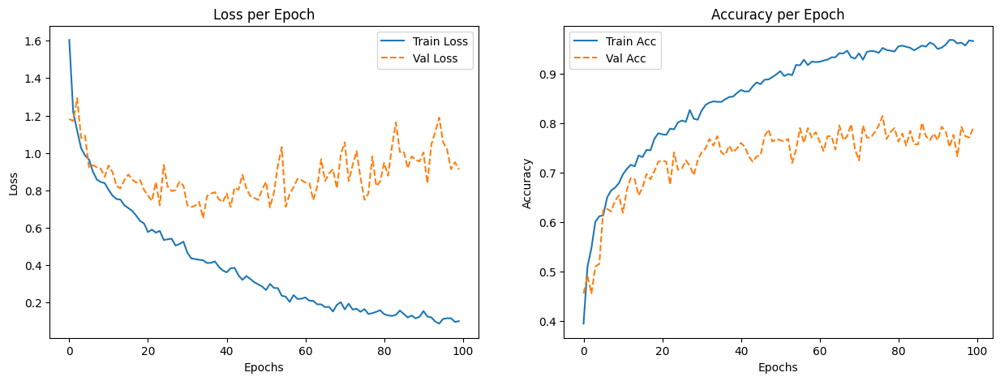

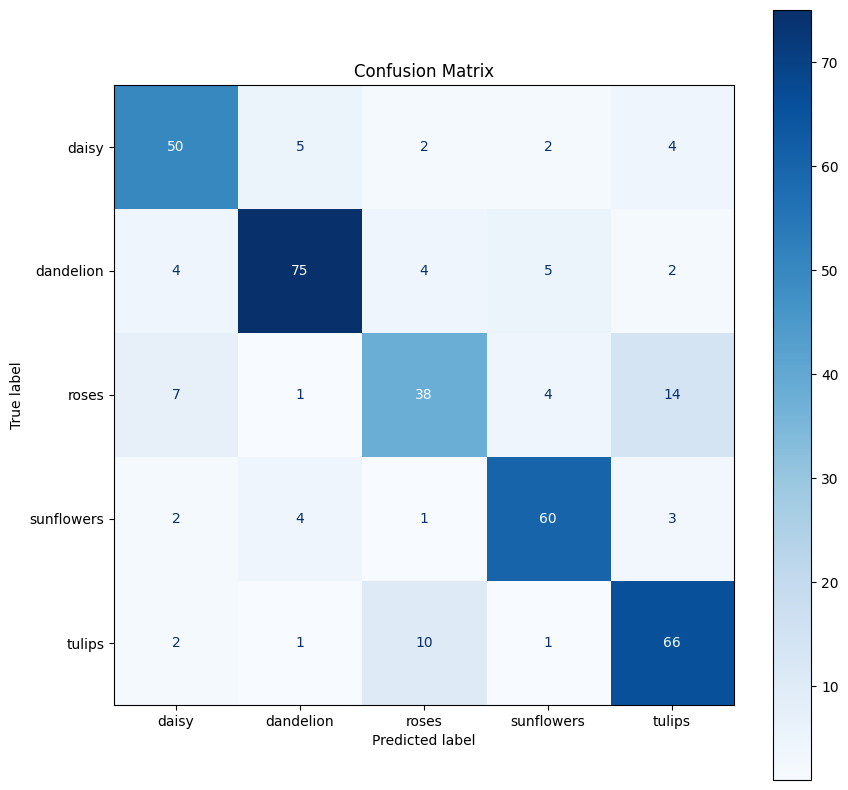

In [82]:
# 1. Plot Loss and Accuracy
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

# Loss Plot
ax[0].plot(history['train_loss'], label='Train Loss')
ax[0].plot(history['val_loss'], label='Val Loss', linestyle='--')
ax[0].set_title('Loss per Epoch')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].legend()

# Accuracy Plot
ax[1].plot(history['train_acc'], label='Train Acc')
ax[1].plot(history['val_acc'], label='Val Acc', linestyle='--')
ax[1].set_title('Accuracy per Epoch')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Accuracy')
ax[1].legend()

plt.show()

# 2. Confusion Matrix (on Validation or Test Set)
# We use the best model state here ideally
model2H.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in val_loaderT: # Or test_loader
        images, labels = images.to(device), labels.to(device)
        outputs = model2H(images)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_LIST)
fig, ax = plt.subplots(figsize=(10, 10))
disp.plot(cmap='Blues', ax=ax)
plt.title('Confusion Matrix')
plt.show()

In [83]:
model2H.to(device)
model2H.eval()

y_true = []
y_pred = []

with torch.no_grad():  # Save memory, don't calculate gradients
    for images, labels in test_loaderT:  # Use test_loader here!
        images = images.to(device)
        labels = labels.to(device)
        
        # Forward pass
        outputs = model2H(images)
        
        # Get predictions
        _, predicted = torch.max(outputs, 1)
        
        # Move to CPU and convert to numpy for sklearn
        y_pred.extend(predicted.cpu().numpy())
        y_true.extend(labels.cpu().numpy())

# 4. Calculate Macro F1
macro_f1 = f1_score(y_true, y_pred, average='macro')
print(f'Final Test Set Macro F1 Score: {macro_f1:.4f}')

Final Test Set Macro F1 Score: 0.8512


10 epochs : Final Test Set Macro F1 Score: 0.6885 -2H
50 epochs : Final Test Set Macro F1 Score: 0.8094 - 2H
100 epochs :Final Test Set Macro F1 Score: 0.8512 -2H

In [84]:
image_path_list = []
label_list = []

for class_cat in os.listdir("tf_flowers_images"):
    if class_cat.startswith("."):   # ignore system files
        continue
    for image_object in os.listdir(f"tf_flowers_images/{class_cat}"):
        if image_object.startswith("."):
            continue
        image_path_list.append(f"tf_flowers_images/{class_cat}/{image_object}")
        label_list.append(class_cat)
df = pd.DataFrame()

df["image_path"] = image_path_list
df["label"] = label_list

df

# Get unique classes
classes = df['label'].unique()


train_val_df, test_df = train_test_split(
    df, test_size=0.10, stratify=df['label'], random_state=42
)

# 2. Split the remaining 90% into TRAIN (e.g., ~80% total) and VALIDATION (e.g., ~10% total)
# 0.111 of 90% is roughly 10% of the total original data
train_df, val_df = train_test_split(
    train_val_df, test_size=0.111, stratify=train_val_df['label'], random_state=42
)

print(f"Original dataset shape: {df.shape}")
print(f"Train size: {len(train_df)}")
print(f"Val size: {len(val_df)}")
print(f"Test size: {len(test_df)}")


# Print class distribution
print("\nClass distribution:")
print("Original:")
print(df['label'].value_counts(normalize=True))
print("\nTrain:")
print(train_df['label'].value_counts(normalize=True))
print("\nTest:")
print(test_df['label'].value_counts(normalize=True))

# %%
IMAGE_SIZE = 128

# this will be used during training, this will hold all the augmentation/transformation configs
training_transform = transforms.Compose([transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
                                             transforms.ToTensor(),
                                         transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

# this will be used during testing / infernece, wo don't want any kind of additional transformation applied at the time of running model prediction in test / production inviroment
test_transform = transforms.Compose([transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
                                             transforms.ToTensor(),
                                     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
TRANSFORMS = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.RandomRotation(30),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(),
    transforms.RandomResizedCrop(IMAGE_SIZE, scale=(0.7,1.0)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5),
                         (0.5, 0.5, 0.5)),
])
     #added random resize crop

# %%
# list of classes in your dataset
CLASS_LIST = ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

Original dataset shape: (3670, 2)
Train size: 2936
Val size: 367
Test size: 367

Class distribution:
Original:
label
dandelion     0.244687
tulips        0.217711
sunflowers    0.190463
roses         0.174659
daisy         0.172480
Name: proportion, dtype: float64

Train:
label
dandelion     0.244550
tulips        0.217643
sunflowers    0.190395
roses         0.174728
daisy         0.172684
Name: proportion, dtype: float64

Test:
label
dandelion     0.245232
tulips        0.217984
sunflowers    0.190736
roses         0.174387
daisy         0.171662
Name: proportion, dtype: float64


In [85]:
# Define custom Dataset -> this will help you load images from your csv file
class CustomTrainingData(Dataset):
    def __init__(self, csv_df, class_list, transform=None):
        self.df = csv_df
        self.transform = transform
        self.class_list = class_list

    def __len__(self):
        return self.df.shape[0]

    def __getitem__(self, index):
        image = Image.open(self.df.iloc[index].image_path).convert('RGB')
        label = self.class_list.index(self.df.iloc[index].label)

        if self.transform:
            image = self.transform(image)

        return image, label


BATCH_SIZE = 32
# Create Datasets & Loaders
# Note: Validation uses Test Transforms (No augmentation!)
train_datasetT = CustomTrainingData(train_df, CLASS_LIST, TRANSFORMS)
val_datasetT = CustomTrainingData(val_df, CLASS_LIST, TRANSFORMS) 
test_datasetT = CustomTrainingData(test_df, CLASS_LIST, TRANSFORMS)

train_loaderT = DataLoader(train_datasetT, batch_size=BATCH_SIZE, shuffle=True)
val_loaderT = DataLoader(val_datasetT, batch_size=BATCH_SIZE, shuffle=False)
test_loaderT = DataLoader(test_datasetT, batch_size=BATCH_SIZE, shuffle=False)
     


In [ ]:
class ImageClassifier(nn.Module):
    def __init__(self, num_classes, input_size=(128, 128), channels=3):
        super(ImageClassifier, self).__init__()

        self.input_size = input_size
        self.channels = channels

        # Convolutional layers
        self.conv1 = nn.Conv2d(channels, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, padding=1)

        # Batch normalization layers
        self.bn1 = nn.BatchNorm2d(32)
        self.bn2 = nn.BatchNorm2d(64)
        self.bn3 = nn.BatchNorm2d(128)
        self.bn4 = nn.BatchNorm2d(256)

        # Max pooling layer
        self.pool = nn.MaxPool2d(2, 2)

        # Dropout layer
        self.dropout = nn.Dropout(0.5)

        # Calculate the size of the flattened features
        self._to_linear = None
        self._calculate_to_linear(input_size)

        # Fully connected layers
        self.fc1 = nn.Linear(self._to_linear, 512)
        self.fc2 = nn.Linear(512, num_classes)

    def _calculate_to_linear(self, input_size):
        # This function calculates the size of the flattened features
        x = torch.randn(1, self.channels, *input_size)
        self.conv_forward(x)

    def conv_forward(self, x):
        x = self.pool(F.relu(self.bn1(self.conv1(x))))
        x = self.pool(F.relu(self.bn2(self.conv2(x))))
        x = self.pool(F.relu(self.bn3(self.conv3(x))))
        x = self.pool(F.relu(self.bn4(self.conv4(x))))

        if self._to_linear is None:
            self._to_linear = x[0].shape[0] * x[0].shape[1] * x[0].shape[2]
        return x

    def forward(self, x):
        x = self.conv_forward(x)

        # Flatten the output for the fully connected layer
        # x = x.view(-1, self._to_linear)
        x = x.view(x.size(0), -1)

        # Fully connected layers with ReLU and dropout
        x = self.dropout(F.relu(self.fc1(x)))
        x = self.fc2(x)

        return x
     

In [86]:
# Hyperparameters
BATCH_SIZE = 32
EPOCHS = 50
LEARNING_RATE = 0.001
NUM_CLASSES = len(CLASS_LIST)
INPUT_SIZE = (IMAGE_SIZE, IMAGE_SIZE)
CHANNELS = 3

# %%
# Initialize the model
modelC = ImageClassifier(NUM_CLASSES, INPUT_SIZE, CHANNELS).to(device)
#random crop
# Loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(modelC.parameters(), lr=LEARNING_RATE)

# %%
# Print model summary
print(modelC)

# If you want to see the number of parameters
total_params = sum(p.numel() for p in modelC.parameters())
print(f"Total number of parameters: {total_params}")

# Test with a random input
test_input = torch.randn(1, CHANNELS, *INPUT_SIZE).to(device)
output = modelC(test_input)
print(f"Output shape: {output.shape}")

ImageClassifier(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc1): Linear(in_features=16384, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=5, bias=True)
)
Total number of parameters: 8781061
Output shape: torch.Size(

In [87]:
history = {
    'train_loss': [], 'val_loss': [],
    'train_acc': [], 'val_acc': []
}
# Training loop
for epoch in range(EPOCHS):
    modelC.train()
    train_loss = 0.0
    correct_train = 0
    total_train = 0
    for images, labels in train_loaderT:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = modelC(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    avg_train_loss = train_loss / len(train_loaderT)
    train_acc = correct_train / total_train
    
    # --- VALIDATION ---
    modelC.eval()
    val_loss = 0.0
    correct_val = 0
    total_val = 0
    
    with torch.no_grad():
        for images, labels in val_loaderT:
            images, labels = images.to(device), labels.to(device)
            outputs = modelC(images)
            loss = criterion(outputs, labels)
            
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total_val += labels.size(0)
            correct_val += (predicted == labels).sum().item()
            
    avg_val_loss = val_loss / len(val_loaderT)
    val_acc = correct_val / total_val
    
    # Store history
    history['train_loss'].append(avg_train_loss)
    history['val_loss'].append(avg_val_loss)
    history['train_acc'].append(train_acc)
    history['val_acc'].append(val_acc)
    
    print(f"Epoch {epoch+1}: Train Loss {avg_train_loss:.4f} | Val Loss {avg_val_loss:.4f} | Val Acc {val_acc:.4f}")

Epoch 1: Train Loss 2.6287 | Val Loss 1.1252 | Val Acc 0.5204
Epoch 2: Train Loss 1.1839 | Val Loss 1.2010 | Val Acc 0.4332
Epoch 3: Train Loss 1.1242 | Val Loss 1.0655 | Val Acc 0.5014
Epoch 4: Train Loss 1.0699 | Val Loss 1.0232 | Val Acc 0.5150
Epoch 5: Train Loss 1.0426 | Val Loss 1.1537 | Val Acc 0.5204
Epoch 6: Train Loss 0.9865 | Val Loss 1.0195 | Val Acc 0.6185
Epoch 7: Train Loss 0.9892 | Val Loss 0.9864 | Val Acc 0.6485
Epoch 8: Train Loss 0.9552 | Val Loss 0.9386 | Val Acc 0.5995
Epoch 9: Train Loss 0.9148 | Val Loss 1.0201 | Val Acc 0.5886
Epoch 10: Train Loss 0.9258 | Val Loss 0.9061 | Val Acc 0.6512
Epoch 11: Train Loss 0.8929 | Val Loss 0.9337 | Val Acc 0.6131
Epoch 12: Train Loss 0.9046 | Val Loss 0.8515 | Val Acc 0.6567
Epoch 13: Train Loss 0.8986 | Val Loss 0.9082 | Val Acc 0.6213
Epoch 14: Train Loss 0.8763 | Val Loss 0.9411 | Val Acc 0.6349
Epoch 15: Train Loss 0.8566 | Val Loss 0.8833 | Val Acc 0.6757
Epoch 16: Train Loss 0.8455 | Val Loss 0.9258 | Val Acc 0.6458
E

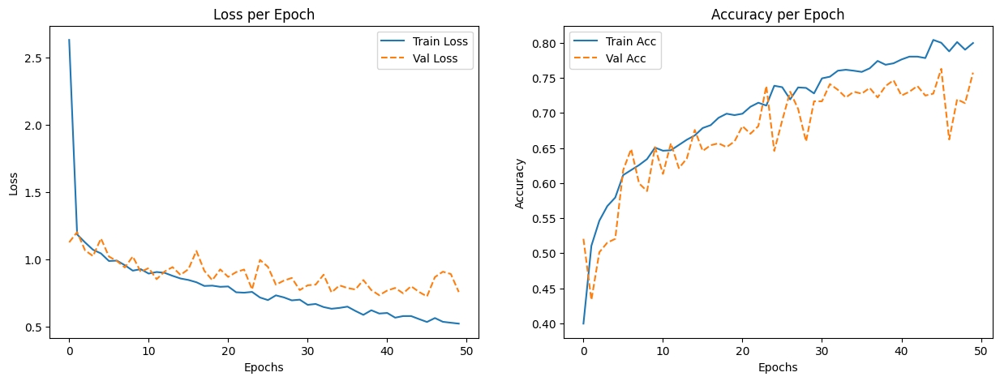

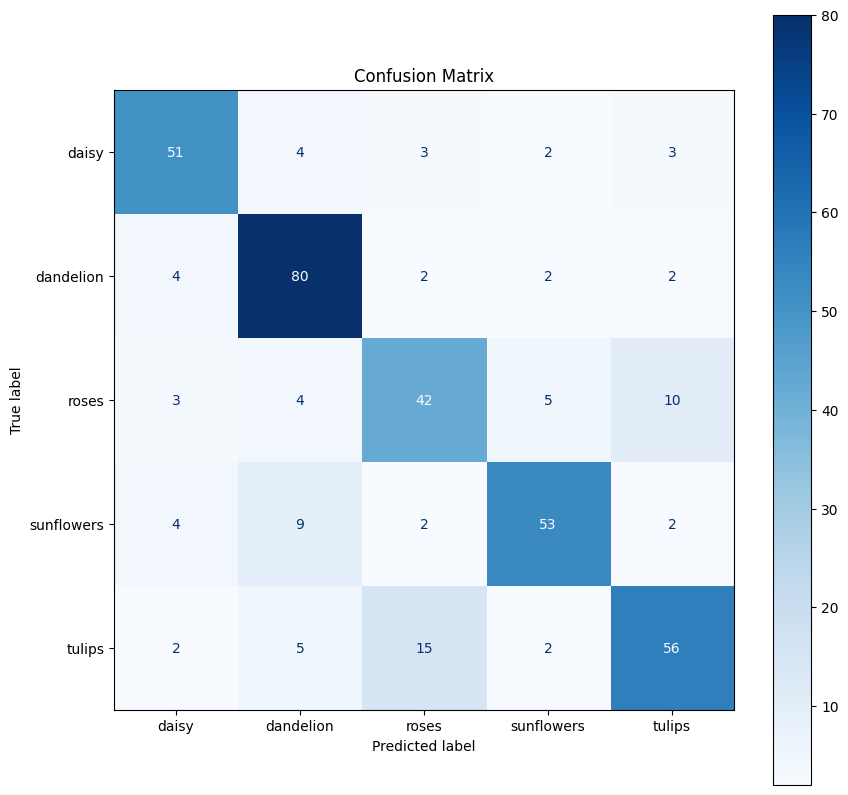

In [88]:
# 1. Plot Loss and Accuracy
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

# Loss Plot
ax[0].plot(history['train_loss'], label='Train Loss')
ax[0].plot(history['val_loss'], label='Val Loss', linestyle='--')
ax[0].set_title('Loss per Epoch')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].legend()

# Accuracy Plot
ax[1].plot(history['train_acc'], label='Train Acc')
ax[1].plot(history['val_acc'], label='Val Acc', linestyle='--')
ax[1].set_title('Accuracy per Epoch')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Accuracy')
ax[1].legend()

plt.show()

# 2. Confusion Matrix (on Validation or Test Set)
# We use the best model state here ideally
modelC.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in val_loaderT: # Or test_loader
        images, labels = images.to(device), labels.to(device)
        outputs = modelC(images)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_LIST)
fig, ax = plt.subplots(figsize=(10, 10))
disp.plot(cmap='Blues', ax=ax)
plt.title('Confusion Matrix')
plt.show()

In [89]:
modelC.to(device)
modelC.eval()

y_true = []
y_pred = []

for images, labels in test_loaderT:
    images = images.to(device)
    outputs = modelC(images)
    _, predicted = torch.max(outputs, 1)
    y_pred.extend(predicted.cpu().numpy())
    y_true.extend(labels.cpu().numpy())

f1 = f1_score(y_true, y_pred, average='macro')

print(f'Final Test Set Macro F1 Score: {f1}')

Final Test Set Macro F1 Score: 0.8077924649521805


50 epochs : Final Test Set Macro F1 Score: 0.8077924649521805



In [90]:
image_path_list = []
label_list = []

for class_cat in os.listdir("tf_flowers_images"):
    if class_cat.startswith("."):   # ignore system files
        continue
    for image_object in os.listdir(f"tf_flowers_images/{class_cat}"):
        if image_object.startswith("."):
            continue
        image_path_list.append(f"tf_flowers_images/{class_cat}/{image_object}")
        label_list.append(class_cat)
df = pd.DataFrame()

df["image_path"] = image_path_list
df["label"] = label_list

df


# Get unique classes
classes = df['label'].unique()

train_val_df, test_df = train_test_split(
    df, test_size=0.10, stratify=df['label'], random_state=42
)

# 2. Split the remaining 90% into TRAIN (e.g., ~80% total) and VALIDATION (e.g., ~10% total)
# 0.111 of 90% is roughly 10% of the total original data
train_df, val_df = train_test_split(
    train_val_df, test_size=0.111, stratify=train_val_df['label'], random_state=42
)

print(f"Original dataset shape: {df.shape}")
print(f"Train size: {len(train_df)}")
print(f"Val size: {len(val_df)}")
print(f"Test size: {len(test_df)}")


# Print class distribution
print("\nClass distribution:")
print("Original:")
print(df['label'].value_counts(normalize=True))
print("\nTrain:")
print(train_df['label'].value_counts(normalize=True))
print("\nTest:")
print(test_df['label'].value_counts(normalize=True))

# %%
IMAGE_SIZE = 128

# this will be used during training, this will hold all the augmentation/transformation configs
training_transform = transforms.Compose([transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
                                             transforms.ToTensor(),
                                         transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

# this will be used during testing / infernece, wo don't want any kind of additional transformation applied at the time of running model prediction in test / production inviroment
test_transform = transforms.Compose([transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
                                             transforms.ToTensor(),
                                     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
TRANSFORMS = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.RandomRotation(30),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(),
    transforms.RandomResizedCrop(IMAGE_SIZE, scale=(0.7,1.0)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5),
                         (0.5, 0.5, 0.5)),
])
     

# %%
# list of classes in your dataset
CLASS_LIST = ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

Original dataset shape: (3670, 2)
Train size: 2936
Val size: 367
Test size: 367

Class distribution:
Original:
label
dandelion     0.244687
tulips        0.217711
sunflowers    0.190463
roses         0.174659
daisy         0.172480
Name: proportion, dtype: float64

Train:
label
dandelion     0.244550
tulips        0.217643
sunflowers    0.190395
roses         0.174728
daisy         0.172684
Name: proportion, dtype: float64

Test:
label
dandelion     0.245232
tulips        0.217984
sunflowers    0.190736
roses         0.174387
daisy         0.171662
Name: proportion, dtype: float64


In [91]:
# Define custom Dataset -> this will help you load images from your csv file
class CustomTrainingData(Dataset):
    def __init__(self, csv_df, class_list, transform=None):
        self.df = csv_df
        self.transform = transform
        self.class_list = class_list

    def __len__(self):
        return self.df.shape[0]

    def __getitem__(self, index):
        image = Image.open(self.df.iloc[index].image_path).convert('RGB')
        label = self.class_list.index(self.df.iloc[index].label)

        if self.transform:
            image = self.transform(image)

        return image, label



BATCH_SIZE = 32
# Create Datasets & Loaders
# Note: Validation uses Test Transforms (No augmentation!)
train_datasetT = CustomTrainingData(train_df, CLASS_LIST, TRANSFORMS)
val_datasetT = CustomTrainingData(val_df, CLASS_LIST, TRANSFORMS) 
test_datasetT = CustomTrainingData(test_df, CLASS_LIST, TRANSFORMS)

train_loaderT = DataLoader(train_datasetT, batch_size=BATCH_SIZE, shuffle=True)
val_loaderT = DataLoader(val_datasetT, batch_size=BATCH_SIZE, shuffle=False)
test_loaderT = DataLoader(test_datasetT, batch_size=BATCH_SIZE, shuffle=False)
     


In [92]:
class LeakyImageClassifier(nn.Module):
    def __init__(self, num_classes, input_size=(128, 128), channels=3):
        super(LeakyImageClassifier, self).__init__()

        self.input_size = input_size
        self.channels = channels

        # Convolutional layers
        self.conv1 = nn.Conv2d(channels, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, padding=1)

        # Batch normalization layers
        self.bn1 = nn.BatchNorm2d(32)
        self.bn2 = nn.BatchNorm2d(64)
        self.bn3 = nn.BatchNorm2d(128)
        self.bn4 = nn.BatchNorm2d(256)

        # Max pooling layer
        self.pool = nn.MaxPool2d(2, 2)

        # Dropout layer
        self.dropout = nn.Dropout(0.5)

        # Calculate the size of the flattened features
        self._to_linear = None
        self._calculate_to_linear(input_size)

        # Fully connected layers
        self.fc1 = nn.Linear(self._to_linear, 512)
        self.fc2 = nn.Linear(512, num_classes)

    def _calculate_to_linear(self, input_size):
        # This function calculates the size of the flattened features
        x = torch.randn(1, self.channels, *input_size)
        self.conv_forward(x)

    def conv_forward(self, x):
        x = self.pool(F.leaky_relu(self.bn1(self.conv1(x)), 0.1))
        x = self.pool(F.leaky_relu(self.bn2(self.conv2(x)), 0.1))
        x = self.pool(F.leaky_relu(self.bn3(self.conv3(x)), 0.1))
        x = self.pool(F.leaky_relu(self.bn4(self.conv4(x)), 0.1))

        if self._to_linear is None:
            self._to_linear = x[0].shape[0] * x[0].shape[1] * x[0].shape[2]
        return x

    def forward(self, x):
        x = self.conv_forward(x)

        # Flatten the output for the fully connected layer
        # x = x.view(-1, self._to_linear)
        x = x.view(x.size(0), -1)

        # Fully connected layers with ReLU and dropout
        x = self.dropout(F.relu(self.fc1(x)))
        x = self.fc2(x)

        return x
     

In [94]:
# Hyperparameters
BATCH_SIZE = 32
EPOCHS = 50
LEARNING_RATE = 0.001
NUM_CLASSES = len(CLASS_LIST)
INPUT_SIZE = (IMAGE_SIZE, IMAGE_SIZE)
CHANNELS = 3

# %%
# Initialize the model
modelL = LeakyImageClassifier(NUM_CLASSES, INPUT_SIZE, CHANNELS).to(device)

# Loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(modelL.parameters(), lr=LEARNING_RATE)

# %%
# Print model summary
print(modelL)

# If you want to see the number of parameters
total_params = sum(p.numel() for p in modelL.parameters())
print(f"Total number of parameters: {total_params}")

# Test with a random input
test_input = torch.randn(1, CHANNELS, *INPUT_SIZE).to(device)
output = modelL(test_input)
print(f"Output shape: {output.shape}")

LeakyImageClassifier(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc1): Linear(in_features=16384, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=5, bias=True)
)
Total number of parameters: 8781061
Output shape: torch.

In [95]:
history = {
    'train_loss': [], 'val_loss': [],
    'train_acc': [], 'val_acc': []
}
# Training loop
for epoch in range(EPOCHS):
    modelL.train()
    train_loss = 0.0
    correct_train = 0
    total_train = 0
    for images, labels in train_loaderT:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = modelL(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    avg_train_loss = train_loss / len(train_loaderT)
    train_acc = correct_train / total_train
    
    # --- VALIDATION ---
    modelL.eval()
    val_loss = 0.0
    correct_val = 0
    total_val = 0
    
    with torch.no_grad():
        for images, labels in val_loaderT:
            images, labels = images.to(device), labels.to(device)
            outputs = modelL(images)
            loss = criterion(outputs, labels)
            
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total_val += labels.size(0)
            correct_val += (predicted == labels).sum().item()
            
    avg_val_loss = val_loss / len(val_loaderT)
    val_acc = correct_val / total_val
    
    # Store history
    history['train_loss'].append(avg_train_loss)
    history['val_loss'].append(avg_val_loss)
    history['train_acc'].append(train_acc)
    history['val_acc'].append(val_acc)
    
    print(f"Epoch {epoch+1}: Train Loss {avg_train_loss:.4f} | Val Loss {avg_val_loss:.4f} | Val Acc {val_acc:.4f}")

Epoch 1: Train Loss 2.0984 | Val Loss 1.1964 | Val Acc 0.5014
Epoch 2: Train Loss 1.1614 | Val Loss 1.1658 | Val Acc 0.4687
Epoch 3: Train Loss 1.0913 | Val Loss 1.0711 | Val Acc 0.5531
Epoch 4: Train Loss 1.0822 | Val Loss 1.0358 | Val Acc 0.5695
Epoch 5: Train Loss 1.0633 | Val Loss 1.0334 | Val Acc 0.5613
Epoch 6: Train Loss 1.0352 | Val Loss 1.0580 | Val Acc 0.6076
Epoch 7: Train Loss 1.0127 | Val Loss 1.0278 | Val Acc 0.5722
Epoch 8: Train Loss 1.0058 | Val Loss 0.9692 | Val Acc 0.6158
Epoch 9: Train Loss 0.9874 | Val Loss 0.9644 | Val Acc 0.6240
Epoch 10: Train Loss 0.9521 | Val Loss 0.9507 | Val Acc 0.6540
Epoch 11: Train Loss 0.9227 | Val Loss 0.9165 | Val Acc 0.6540
Epoch 12: Train Loss 0.8923 | Val Loss 0.9331 | Val Acc 0.6458
Epoch 13: Train Loss 0.9148 | Val Loss 1.0259 | Val Acc 0.5886
Epoch 14: Train Loss 0.8805 | Val Loss 0.9501 | Val Acc 0.6485
Epoch 15: Train Loss 0.8486 | Val Loss 0.9207 | Val Acc 0.6621
Epoch 16: Train Loss 0.8858 | Val Loss 0.9285 | Val Acc 0.6621
E

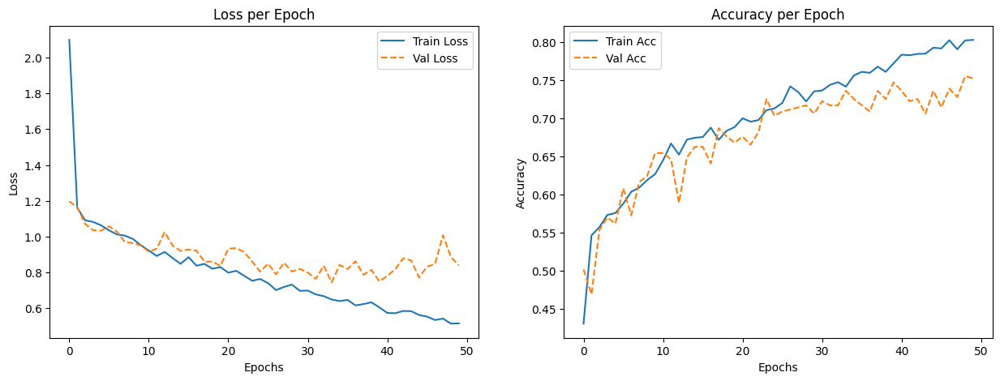

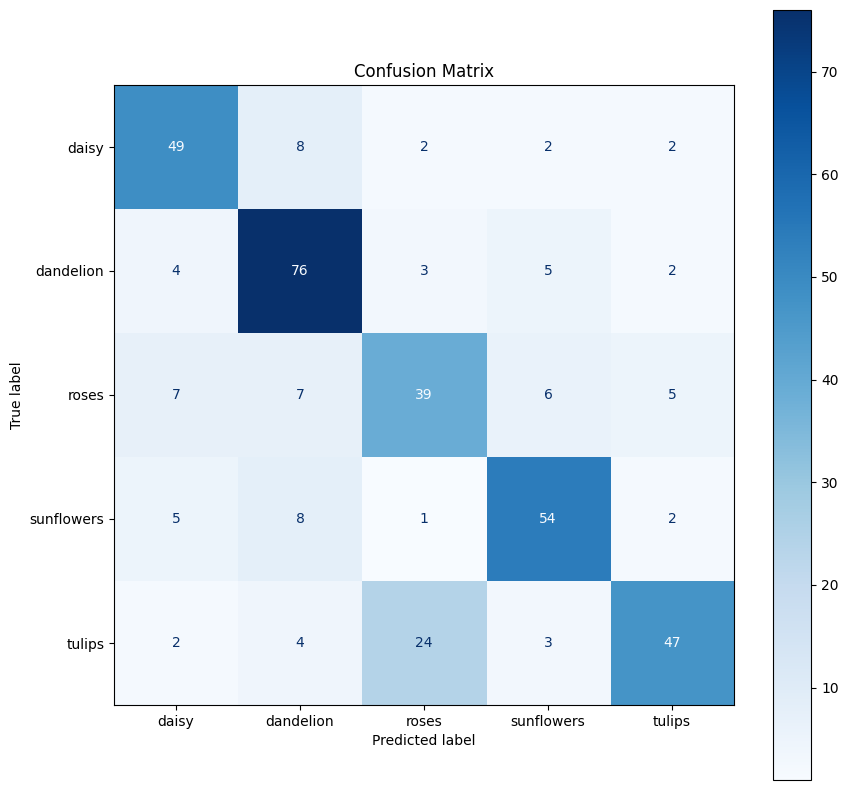

In [96]:
# 1. Plot Loss and Accuracy
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

# Loss Plot
ax[0].plot(history['train_loss'], label='Train Loss')
ax[0].plot(history['val_loss'], label='Val Loss', linestyle='--')
ax[0].set_title('Loss per Epoch')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].legend()

# Accuracy Plot
ax[1].plot(history['train_acc'], label='Train Acc')
ax[1].plot(history['val_acc'], label='Val Acc', linestyle='--')
ax[1].set_title('Accuracy per Epoch')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Accuracy')
ax[1].legend()

plt.show()

# 2. Confusion Matrix (on Validation or Test Set)
# We use the best model state here ideally
modelL.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in val_loaderT: # Or test_loader
        images, labels = images.to(device), labels.to(device)
        outputs = modelL(images)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_LIST)
fig, ax = plt.subplots(figsize=(10, 10))
disp.plot(cmap='Blues', ax=ax)
plt.title('Confusion Matrix')
plt.show()

In [97]:
modelL.to(device)
modelL.eval()

y_true = []
y_pred = []

for images, labels in test_loaderT:
    images = images.to(device)
    outputs = modelL(images)
    _, predicted = torch.max(outputs, 1)
    y_pred.extend(predicted.cpu().numpy())
    y_true.extend(labels.cpu().numpy())

f1 = f1_score(y_true, y_pred, average='macro')

print(f'Macro F1 Score: {f1}')

Macro F1 Score: 0.7769466496248005


Leaky Relu
50 epochs : Macro F1 Score: 0.7769466496248005




In [98]:
image_path_list = []
label_list = []

for class_cat in os.listdir("tf_flowers_images"):
    if class_cat.startswith("."):   # ignore system files
        continue
    for image_object in os.listdir(f"tf_flowers_images/{class_cat}"):
        if image_object.startswith("."):
            continue
        image_path_list.append(f"tf_flowers_images/{class_cat}/{image_object}")
        label_list.append(class_cat)
df = pd.DataFrame()

df["image_path"] = image_path_list
df["label"] = label_list

df


# Get unique classes
classes = df['label'].unique()
train_val_df, test_df = train_test_split(
    df, test_size=0.10, stratify=df['label'], random_state=42
)

# 2. Split the remaining 90% into TRAIN (e.g., ~80% total) and VALIDATION (e.g., ~10% total)
# 0.111 of 90% is roughly 10% of the total original data
train_df, val_df = train_test_split(
    train_val_df, test_size=0.111, stratify=train_val_df['label'], random_state=42
)

print(f"Original dataset shape: {df.shape}")
print(f"Train size: {len(train_df)}")
print(f"Val size: {len(val_df)}")
print(f"Test size: {len(test_df)}")

# Print class distribution
print("\nClass distribution:")
print("Original:")
print(df['label'].value_counts(normalize=True))
print("\nTrain:")
print(train_df['label'].value_counts(normalize=True))
print("\nTest:")
print(test_df['label'].value_counts(normalize=True))

# %%
IMAGE_SIZE = 128

# this will be used during training, this will hold all the augmentation/transformation configs
training_transform = transforms.Compose([transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
                                             transforms.ToTensor(),
                                         transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

# this will be used during testing / infernece, wo don't want any kind of additional transformation applied at the time of running model prediction in test / production inviroment
test_transform = transforms.Compose([transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
                                             transforms.ToTensor(),
                                     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
TRANSFORMS = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.RandomRotation(30),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(),
    transforms.RandomResizedCrop(128, scale=(0.7,1.0)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5),
                         (0.5, 0.5, 0.5)),
])
     

# %%
# list of classes in your dataset
CLASS_LIST = ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

Original dataset shape: (3670, 2)
Train size: 2936
Val size: 367
Test size: 367

Class distribution:
Original:
label
dandelion     0.244687
tulips        0.217711
sunflowers    0.190463
roses         0.174659
daisy         0.172480
Name: proportion, dtype: float64

Train:
label
dandelion     0.244550
tulips        0.217643
sunflowers    0.190395
roses         0.174728
daisy         0.172684
Name: proportion, dtype: float64

Test:
label
dandelion     0.245232
tulips        0.217984
sunflowers    0.190736
roses         0.174387
daisy         0.171662
Name: proportion, dtype: float64


In [99]:
# Define custom Dataset -> this will help you load images from your csv file
class CustomTrainingData(Dataset):
    def __init__(self, csv_df, class_list, transform=None):
        self.df = csv_df
        self.transform = transform
        self.class_list = class_list

    def __len__(self):
        return self.df.shape[0]

    def __getitem__(self, index):
        image = Image.open(self.df.iloc[index].image_path).convert('RGB')
        label = self.class_list.index(self.df.iloc[index].label)

        if self.transform:
            image = self.transform(image)

        return image, label



BATCH_SIZE = 32
# Create Datasets & Loaders
# Note: Validation uses Test Transforms (No augmentation!)
train_datasetT = CustomTrainingData(train_df, CLASS_LIST, TRANSFORMS)
val_datasetT = CustomTrainingData(val_df, CLASS_LIST, TRANSFORMS) 
test_datasetT = CustomTrainingData(test_df, CLASS_LIST, TRANSFORMS)

train_loaderT = DataLoader(train_datasetT, batch_size=BATCH_SIZE, shuffle=True)
val_loaderT = DataLoader(val_datasetT, batch_size=BATCH_SIZE, shuffle=False)
test_loaderT = DataLoader(test_datasetT, batch_size=BATCH_SIZE, shuffle=False)
     

In [100]:
class ImageClassifierNoBN(nn.Module):
    def __init__(self, num_classes, input_size=(IMAGE_SIZE, IMAGE_SIZE), channels=3):
        super(ImageClassifierNoBN, self).__init__()

        self.input_size = input_size
        self.channels = channels

        # Convolutional layers
        self.conv1 = nn.Conv2d(channels, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, padding=1)

        # REMOVED: All self.bn1, self.bn2, etc. lines

        # Max pooling layer
        self.pool = nn.MaxPool2d(2, 2)

        # Dropout layer
        self.dropout = nn.Dropout(0.5)

        # Calculate the size of the flattened features
        self._to_linear = None
        self._calculate_to_linear(input_size)

        # Fully connected layers
        self.fc1 = nn.Linear(self._to_linear, 512)
        self.fc2 = nn.Linear(512, num_classes)

    def _calculate_to_linear(self, input_size):
        x = torch.randn(1, self.channels, *input_size)
        self.conv_forward(x)

    def conv_forward(self, x):
        # Removed self.bnX() calls from these lines
        # Now it goes directly: Conv -> ReLU -> Pool
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))
        x = self.pool(F.relu(self.conv4(x)))

        if self._to_linear is None:
            self._to_linear = x[0].shape[0] * x[0].shape[1] * x[0].shape[2]
        return x

    def forward(self, x):
        x = self.conv_forward(x)

        # Flatten
        x = x.view(-1, self._to_linear)

        # Fully connected layers
        x = self.dropout(F.relu(self.fc1(x)))
        x = self.fc2(x)

        return x

In [101]:
# Hyperparameters
BATCH_SIZE = 32
EPOCHS = 50
LEARNING_RATE = 0.001
NUM_CLASSES = len(CLASS_LIST)
INPUT_SIZE = (IMAGE_SIZE, IMAGE_SIZE)
CHANNELS = 3

# %%
# Initialize the model
modelNB = ImageClassifierNoBN(NUM_CLASSES, INPUT_SIZE, CHANNELS).to(device)

# Loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(modelNB.parameters(), lr=LEARNING_RATE, weight_decay=1e-4)

# %%
# Print model summary
print(modelNB)

# If you want to see the number of parameters
total_params = sum(p.numel() for p in modelNB.parameters())
print(f"Total number of parameters: {total_params}")

# Test with a random input
test_input = torch.randn(1, CHANNELS, *INPUT_SIZE).to(device)
output = modelNB(test_input)
print(f"Output shape: {output.shape}")

ImageClassifierNoBN(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc1): Linear(in_features=16384, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=5, bias=True)
)
Total number of parameters: 8780101
Output shape: torch.Size([1, 5])


In [ ]:
history = {
    'train_loss': [], 'val_loss': [],
    'train_acc': [], 'val_acc': []
}
# Training loop
for epoch in range(EPOCHS):
    modelNB.train()
    train_loss = 0.0
    correct_train = 0
    total_train = 0
    for images, labels in train_loaderT:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = modelNB(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    avg_train_loss = train_loss / len(train_loaderT)
    train_acc = correct_train / total_train
    
    # --- VALIDATION ---
    modelNB.eval()
    val_loss = 0.0
    correct_val = 0
    total_val = 0
    
    with torch.no_grad():
        for images, labels in val_loaderT:
            images, labels = images.to(device), labels.to(device)
            outputs = modelNB(images)
            loss = criterion(outputs, labels)
            
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total_val += labels.size(0)
            correct_val += (predicted == labels).sum().item()
            
    avg_val_loss = val_loss / len(val_loaderT)
    val_acc = correct_val / total_val
    
    # Store history
    history['train_loss'].append(avg_train_loss)
    history['val_loss'].append(avg_val_loss)
    history['train_acc'].append(train_acc)
    history['val_acc'].append(val_acc)
    
    print(f"Epoch {epoch+1}: Train Loss {avg_train_loss:.4f} | Val Loss {avg_val_loss:.4f} | Val Acc {val_acc:.4f}")

Epoch 1: Train Loss 1.3042 | Val Loss 1.1342 | Val Acc 0.5204
Epoch 2: Train Loss 1.0912 | Val Loss 1.0604 | Val Acc 0.5450
Epoch 3: Train Loss 0.9995 | Val Loss 0.9758 | Val Acc 0.6022
Epoch 4: Train Loss 0.9128 | Val Loss 0.9851 | Val Acc 0.5668
Epoch 5: Train Loss 0.8535 | Val Loss 0.9853 | Val Acc 0.6022
Epoch 6: Train Loss 0.8237 | Val Loss 0.9950 | Val Acc 0.5913
Epoch 7: Train Loss 0.7675 | Val Loss 0.9216 | Val Acc 0.6540
Epoch 8: Train Loss 0.7483 | Val Loss 0.8956 | Val Acc 0.6785
Epoch 9: Train Loss 0.7425 | Val Loss 0.9010 | Val Acc 0.6294
Epoch 10: Train Loss 0.7308 | Val Loss 0.8695 | Val Acc 0.7003
Epoch 11: Train Loss 0.6863 | Val Loss 0.8557 | Val Acc 0.6839
Epoch 12: Train Loss 0.6638 | Val Loss 0.8342 | Val Acc 0.6812
Epoch 13: Train Loss 0.6449 | Val Loss 0.8635 | Val Acc 0.6649
Epoch 14: Train Loss 0.6154 | Val Loss 0.8914 | Val Acc 0.6676
Epoch 15: Train Loss 0.6362 | Val Loss 0.7727 | Val Acc 0.7302
Epoch 16: Train Loss 0.6314 | Val Loss 0.8750 | Val Acc 0.6812
E

In [ ]:
# 1. Plot Loss and Accuracy
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

# Loss Plot
ax[0].plot(history['train_loss'], label='Train Loss')
ax[0].plot(history['val_loss'], label='Val Loss', linestyle='--')
ax[0].set_title('Loss per Epoch')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].legend()

# Accuracy Plot
ax[1].plot(history['train_acc'], label='Train Acc')
ax[1].plot(history['val_acc'], label='Val Acc', linestyle='--')
ax[1].set_title('Accuracy per Epoch')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Accuracy')
ax[1].legend()

plt.show()

# 2. Confusion Matrix (on Validation or Test Set)
# We use the best model state here ideally
modelNB.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in val_loaderT: # Or test_loader
        images, labels = images.to(device), labels.to(device)
        outputs = modelNB(images)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_LIST)
fig, ax = plt.subplots(figsize=(10, 10))
disp.plot(cmap='Blues', ax=ax)
plt.title('Confusion Matrix')
plt.show()

In [ ]:
modelNB.to(device)
modelNB.eval()

y_true = []
y_pred = []

for images, labels in test_loaderT:
    images = images.to(device)
    outputs = modelNB(images)
    _, predicted = torch.max(outputs, 1)
    y_pred.extend(predicted.cpu().numpy())
    y_true.extend(labels.cpu().numpy())

f1 = f1_score(y_true, y_pred, average='macro')

print(f'Final Test Set Macro F1 Score: {f1}')

Macro F1 Score: 0.8249290013496534


cu weight gain
10 epochs : Macro F1 Score: 0.6479617685118915
100 epochs : Macro F1 Score: 0.8125848336204019
150 epochs : Macro F1 Score: 0.8249290013496534

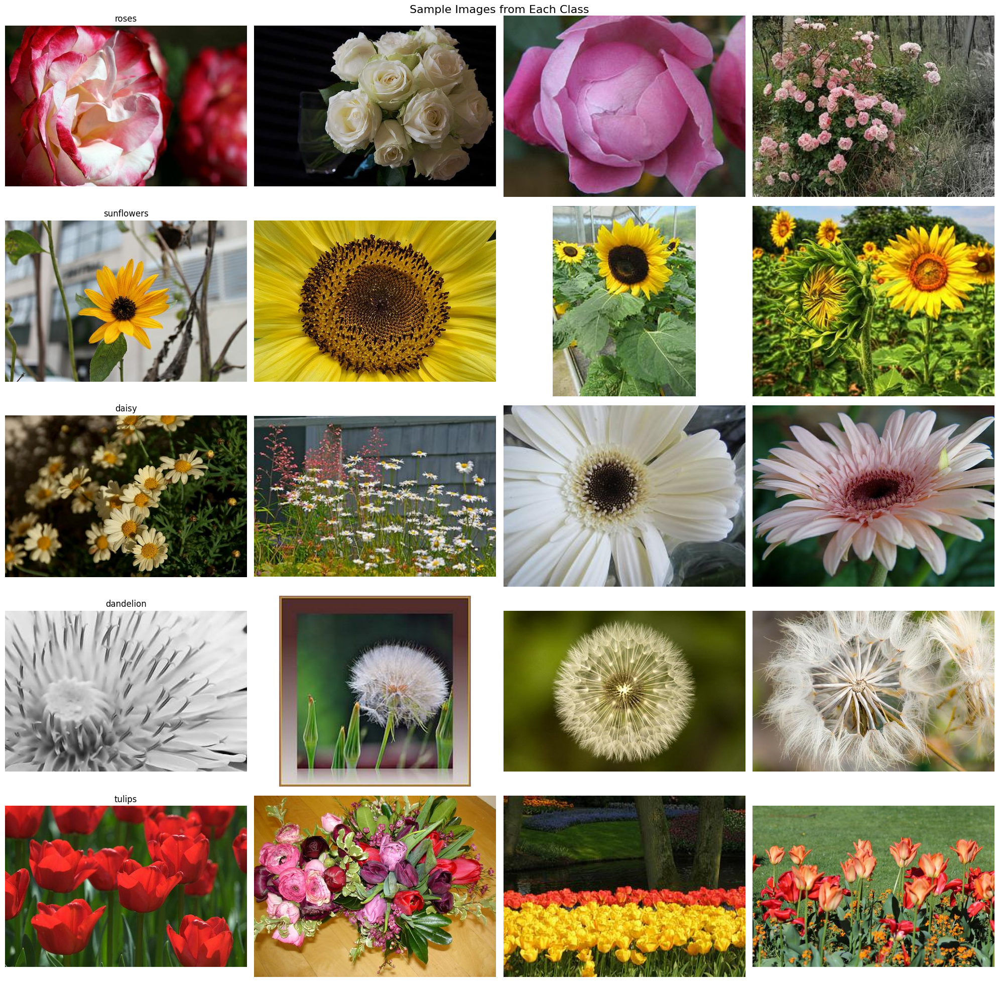

Original dataset shape: (3670, 2)
Train dataset shape: (2936, 2)
Test dataset shape: (734, 2)

Class distribution:
Original:
label
dandelion     0.244687
tulips        0.217711
sunflowers    0.190463
roses         0.174659
daisy         0.172480
Name: proportion, dtype: float64

Train:
label
dandelion     0.244891
tulips        0.217643
sunflowers    0.190395
roses         0.174728
daisy         0.172343
Name: proportion, dtype: float64

Test:
label
dandelion     0.243869
tulips        0.217984
sunflowers    0.190736
roses         0.174387
daisy         0.173025
Name: proportion, dtype: float64


In [484]:
image_path_list = []
label_list = []

for class_cat in os.listdir("tf_flowers_images"):
    if class_cat.startswith("."):   # ignore system files
        continue
    for image_object in os.listdir(f"tf_flowers_images/{class_cat}"):
        if image_object.startswith("."):
            continue
        image_path_list.append(f"tf_flowers_images/{class_cat}/{image_object}")
        label_list.append(class_cat)
df = pd.DataFrame()

df["image_path"] = image_path_list
df["label"] = label_list

df


# Get unique classes
classes = df['label'].unique()

# Number of images to display per class
n_images = 4

# Set up the plot
fig, axes = plt.subplots(len(classes), n_images, figsize=(20, 4*len(classes)))
fig.suptitle('Sample Images from Each Class', fontsize=16)

for i, class_name in enumerate(classes):
    # Filter dataframe for current class
    class_df = df[df['label'] == class_name]

    # Randomly sample n_images from this class
    sample_images = class_df['image_path'].sample(n_images).tolist()

    for j, img_path in enumerate(sample_images):
        # Open and display the image
        img = Image.open(img_path)
        axes[i, j].imshow(img)
        axes[i, j].axis('off')

        # Set the title for the first image in each row
        if j == 0:
            axes[i, j].set_title(f'{class_name}', fontsize=12)

plt.tight_layout()
plt.show()

# %%
test_ratio = 0.20 # 20% of data will go to test

# split the data
train_df, test_df = train_test_split(df, test_size=test_ratio, stratify=df['label'], random_state=42)

print(f"Original dataset shape: {df.shape}")
print(f"Train dataset shape: {train_df.shape}")
print(f"Test dataset shape: {test_df.shape}")


# Print class distribution
print("\nClass distribution:")
print("Original:")
print(df['label'].value_counts(normalize=True))
print("\nTrain:")
print(train_df['label'].value_counts(normalize=True))
print("\nTest:")
print(test_df['label'].value_counts(normalize=True))

# %%
IMAGE_SIZE = 224

# this will be used during training, this will hold all the augmentation/transformation configs
training_transform = transforms.Compose([transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
                                             transforms.ToTensor(),
                                         transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

# this will be used during testing / infernece, wo don't want any kind of additional transformation applied at the time of running model prediction in test / production inviroment
test_transform = transforms.Compose([transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
                                             transforms.ToTensor(),
                                     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
TRANSFORMS = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.RandomRotation(30),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(),
    transforms.RandomResizedCrop(IMAGE_SIZE, scale=(0.7,1.0)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5),
                         (0.5, 0.5, 0.5)),
])
     

# %%
# list of classes in your dataset
CLASS_LIST = ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

In [485]:
# Define custom Dataset -> this will help you load images from your csv file
class CustomTrainingData(Dataset):
    def __init__(self, csv_df, class_list, transform=None):
        self.df = csv_df
        self.transform = transform
        self.class_list = class_list

    def __len__(self):
        return self.df.shape[0]

    def __getitem__(self, index):
        image = Image.open(self.df.iloc[index].image_path).convert('RGB')
        label = self.class_list.index(self.df.iloc[index].label)

        if self.transform:
            image = self.transform(image)

        return image, label


# create data object
train_data_object = CustomTrainingData(train_df, CLASS_LIST, TRANSFORMS)
test_data_object = CustomTrainingData(test_df, CLASS_LIST, TRANSFORMS)
     

# %%
BATCH_SIZE = 32

# now define dataloader, this will load the images batches from CustomTrainingData object
train_loader = DataLoader(train_data_object, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(test_data_object, batch_size=BATCH_SIZE, shuffle=True)


In [486]:
class SatelliteImageClassifier(nn.Module):
    def __init__(self, num_classes, input_size=(224, 224), channels=3):
        super(SatelliteImageClassifier, self).__init__()

        self.input_size = input_size
        self.channels = channels

        # --- CONVOLUTIONAL LAYERS ---
        # Layer 1: 3 -> 32
        self.conv1 = nn.Conv2d(channels, 32, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        
        # Layer 2: 32 -> 64
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        
        # Layer 3: 64 -> 128
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm2d(128)
        
        # Layer 4: 128 -> 256
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.bn4 = nn.BatchNorm2d(256)
        
        # NEW Layer 5: 256 -> 512 (Standard doubling pattern)
        self.conv5 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.bn5 = nn.BatchNorm2d(512)

        # Max pooling layer (used for all)
        self.pool = nn.MaxPool2d(2, 2)
        
        # Dropout
        self.dropout = nn.Dropout(0.5)

        # --- DYNAMIC CALCULATION ---
        self._to_linear = None
        # This will run a dummy pass to calculate 25,088 automatically
        self._calculate_to_linear(input_size)

        # --- FULLY CONNECTED LAYERS ---
        # fc1 now accepts the output of conv5
        self.fc1 = nn.Linear(self._to_linear, 1024) # Increased neurons for deeper network
        self.fc2 = nn.Linear(1024, num_classes)

    def _calculate_to_linear(self, input_size):
        # This function calculates the size of the flattened features
        x = torch.randn(1, self.channels, *input_size)
        self.conv_forward(x)

    def conv_forward(self, x):
        x = self.pool(F.relu(self.bn1(self.conv1(x))))
        x = self.pool(F.relu(self.bn2(self.conv2(x))))
        x = self.pool(F.relu(self.bn3(self.conv3(x))))
        x = self.pool(F.relu(self.bn4(self.conv4(x))))
        x = self.pool(F.relu(self.bn5(self.conv5(x))))
        if self._to_linear is None:
            self._to_linear = x[0].shape[0] * x[0].shape[1] * x[0].shape[2]
        return x

    def forward(self, x):
        x = self.conv_forward(x)

        # Flatten the output for the fully connected layer
        # x = x.view(-1, self._to_linear)
        x = x.view(x.size(0), -1)

        # Fully connected layers with ReLU and dropout
        x = self.dropout(F.relu(self.fc1(x)))
        x = self.fc2(x)

        return x
     

In [487]:
# Hyperparameters
BATCH_SIZE = 32
EPOCHS = 200
LEARNING_RATE = 0.001
NUM_CLASSES = len(CLASS_LIST)
INPUT_SIZE = (IMAGE_SIZE, IMAGE_SIZE)
CHANNELS = 3

# %%
# Initialize the model
model = SatelliteImageClassifier(NUM_CLASSES, INPUT_SIZE, CHANNELS).to(device)

# Loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

# %%
# Print model summary
print(model)

# If you want to see the number of parameters
total_params = sum(p.numel() for p in model.parameters())
print(f"Total number of parameters: {total_params}")

# Test with a random input
test_input = torch.randn(1, CHANNELS, *INPUT_SIZE).to(device)
output = model(test_input)
print(f"Output shape: {output.shape}")

SatelliteImageClassifier(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv5): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn5): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc1): 

In [488]:
# Training loop
for epoch in range(EPOCHS):
    model.train()
    running_loss = 0.0
    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f'Epoch [{epoch+1}/{EPOCHS}], Loss: {running_loss/len(train_loader):.4f}')

Epoch [1/200], Loss: 3.9154
Epoch [2/200], Loss: 1.2708
Epoch [3/200], Loss: 1.1580
Epoch [4/200], Loss: 1.1098
Epoch [5/200], Loss: 1.0698
Epoch [6/200], Loss: 1.0643
Epoch [7/200], Loss: 1.0225
Epoch [8/200], Loss: 0.9952
Epoch [9/200], Loss: 0.9768
Epoch [10/200], Loss: 0.9692
Epoch [11/200], Loss: 0.9436
Epoch [12/200], Loss: 0.9203
Epoch [13/200], Loss: 0.9148
Epoch [14/200], Loss: 0.8882
Epoch [15/200], Loss: 0.8840
Epoch [16/200], Loss: 0.8761
Epoch [17/200], Loss: 0.8540
Epoch [18/200], Loss: 0.8333
Epoch [19/200], Loss: 0.8211
Epoch [20/200], Loss: 0.7970
Epoch [21/200], Loss: 0.7733
Epoch [22/200], Loss: 0.7644
Epoch [23/200], Loss: 0.7520
Epoch [24/200], Loss: 0.7464
Epoch [25/200], Loss: 0.7429
Epoch [26/200], Loss: 0.7195
Epoch [27/200], Loss: 0.7098
Epoch [28/200], Loss: 0.7404
Epoch [29/200], Loss: 0.6724
Epoch [30/200], Loss: 0.6888
Epoch [31/200], Loss: 0.6464
Epoch [32/200], Loss: 0.6368
Epoch [33/200], Loss: 0.6328
Epoch [34/200], Loss: 0.6359
Epoch [35/200], Loss: 0

In [489]:
model.to(device)
model.eval()

y_true = []
y_pred = []

for images, labels in test_loader:
    images = images.to(device)
    outputs = model(images)
    _, predicted = torch.max(outputs, 1)
    y_pred.extend(predicted.cpu().numpy())
    y_true.extend(labels.cpu().numpy())

f1 = f1_score(y_true, y_pred, average='macro')

print(f'Macro F1 Score: {f1}')

Macro F1 Score: 0.8476299953384234


Image size = 224
5 conv layers
100 epochs : Macro F1 Score: 0.8400286524193511
200 epochs : Macro F1 Score: 0.8476299953384234